**Gabriela Sandanieli de Aguiar (11913509) - Engenharia de Computação - USP São Carlos**

# **U-Net**

In [ ]:
# Monta o Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Importações principais
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Modelagem e Keras
import tensorflow as tf
from tensorflow.keras import layers, models
import tensorflow.keras.backend as K
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Validação cruzada e estatísticas
from sklearn.model_selection import StratifiedKFold
from collections import Counter
from sklearn.metrics import (
    roc_curve, auc, precision_recall_curve, confusion_matrix,
    precision_score, recall_score, f1_score, jaccard_score,
    ConfusionMatrixDisplay
)

In [ ]:
# Função de carregamento das imagens e máscaras
def load_full_dataset(base_dir):
    X, Y = [], []

    for sub in sorted(os.listdir(base_dir)):
        flair_dir = os.path.join(base_dir, sub, "flair")
        mask_dir = os.path.join(base_dir, sub, "mask")

        for flair_file in sorted(os.listdir(flair_dir)):
            flair_path = os.path.join(flair_dir, flair_file)
            flair_img = cv2.imread(flair_path, cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
            flair_img = np.expand_dims(flair_img, axis=-1)

            mask_img = np.zeros((256, 256), dtype=np.float32)

            if os.path.exists(mask_dir):
                mask_file = flair_file.replace("slice", "mask")
                mask_path = os.path.join(mask_dir, mask_file)

                if os.path.exists(mask_path):
                    mask_img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                    mask_img = (mask_img > 127).astype(np.float32)
            mask_img = np.expand_dims(mask_img, axis=-1)

            X.append(flair_img)
            Y.append(mask_img)
    return np.array(X), np.array(Y)

In [ ]:
# Caminho base onde estão armazenadas as pastas com as imagens
base_dir = '/content/drive/MyDrive/TCC/slices_subs'

# Carrega o dataset completo (imagens FLAIR e máscaras binárias)
X, Y = load_full_dataset(base_dir)

np.save("/content/drive/MyDrive/TCC/ResultadosUnet/X_tcc.npy", X)
np.save("/content/drive/MyDrive/TCC/ResultadosUnet/Y_tcc.npy", Y)

X = np.load("/content/drive/MyDrive/TCC/ResultadosUnet/X_tcc.npy")
Y = np.load("/content/drive/MyDrive/TCC/ResultadosUnet/Y_tcc.npy")

# Confirma o shape esperado
print("✅ Dataset carregado:")
print("X:", X.shape)
print("Y:", Y.shape)

✅ Dataset carregado:
X: (3667, 256, 256, 1)
Y: (3667, 256, 256, 1)


In [ ]:
# Conta o número de pixels com lesão em cada imagem
lesion_pixel_counts = np.array([np.sum(y) for y in Y])

# Define níveis de lesão com base na quantidade de pixels
# 4 faixas para estratificação: 0 (sem lesão), 1 (leve), 2 (média), 3 (alta)
lesion_levels = []
for count in lesion_pixel_counts:
    if count == 0:
        lesion_levels.append(0)
    elif count < 100:
        lesion_levels.append(1)
    elif count < 1000:
        lesion_levels.append(2)
    else:
        lesion_levels.append(3)
lesion_levels = np.array(lesion_levels)

print("\n📊 Distribuição das classes para estratificação (completa):")
print(Counter(lesion_levels))

# Separa dados para teste final (20% do total), com estratificação
from sklearn.model_selection import train_test_split

X_trainval, X_test, Y_trainval, Y_test, levels_trainval, levels_test = train_test_split(
    X, Y, lesion_levels, test_size=0.2, stratify=lesion_levels, random_state=42
)

print("\n📊 Distribuição das classes para treino/validação:")
print(Counter(levels_trainval))

print("\n📊 Distribuição das classes para teste final:")
print(Counter(levels_test))

# Define os folds estratificados a partir do conjunto de treino/validação
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
folds = list(skf.split(X_trainval, levels_trainval))

# Mostra a distribuição de classes em cada fold
for i, (_, val_idx) in enumerate(folds):
    val_classes = levels_trainval[val_idx]
    print(f"\n🔁 Fold {i+1}")
    print(" - Validação - Distribuição das classes:", dict(Counter(val_classes)))


📊 Distribuição das classes para estratificação (completa):
Counter({np.int64(0): 1700, np.int64(1): 963, np.int64(2): 944, np.int64(3): 60})

📊 Distribuição das classes para treino/validação:
Counter({np.int64(0): 1360, np.int64(1): 770, np.int64(2): 755, np.int64(3): 48})

📊 Distribuição das classes para teste final:
Counter({np.int64(0): 340, np.int64(1): 193, np.int64(2): 189, np.int64(3): 12})

🔁 Fold 1
 - Validação - Distribuição das classes: {np.int64(0): 272, np.int64(2): 151, np.int64(1): 154, np.int64(3): 10}

🔁 Fold 2
 - Validação - Distribuição das classes: {np.int64(0): 272, np.int64(1): 154, np.int64(3): 10, np.int64(2): 151}

🔁 Fold 3
 - Validação - Distribuição das classes: {np.int64(2): 151, np.int64(0): 272, np.int64(3): 10, np.int64(1): 154}

🔁 Fold 4
 - Validação - Distribuição das classes: {np.int64(1): 154, np.int64(0): 272, np.int64(2): 151, np.int64(3): 9}

🔁 Fold 5
 - Validação - Distribuição das classes: {np.int64(1): 154, np.int64(0): 272, np.int64(2): 151, n

In [ ]:
# Função para criar a arquitetura U-Net
def unet_model(input_size=(256, 256, 1)):
    inputs = tf.keras.Input(input_size)

    # Encoder
    c1 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c4)

    # Decoder
    u1 = layers.UpSampling2D((2, 2))(c4)
    u1 = layers.Concatenate()([u1, c3])
    c5 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c5 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c5)

    u2 = layers.UpSampling2D((2, 2))(c5)
    u2 = layers.Concatenate()([u2, c2])
    c6 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u2)
    c6 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c6)

    u3 = layers.UpSampling2D((2, 2))(c6)
    u3 = layers.Concatenate()([u3, c1])
    c7 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(u3)
    c7 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(c7)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c7)
    return models.Model(inputs, outputs)

In [ ]:
# Métrica de Dice (usada como métrica e parte da perda)
def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

# Função de perda: Binary Crossentropy ponderada por pixel
def weighted_bce(y_true, y_pred):
    weight = 50.0  # Peso alto para valorizar mais os pixels de lesão
    bce = K.binary_crossentropy(y_true, y_pred)
    weight_vector = y_true * weight + (1. - y_true)
    return K.mean(bce * weight_vector)

# Combinação da perda BCE ponderada + Dice
def combined_loss(y_true, y_pred):
    return 0.5 * weighted_bce(y_true, y_pred) + 0.5 * (1 - dice_coef(y_true, y_pred))

In [ ]:
histories = []      # Histórico por fold
fold_metrics = []   # Métricas globais por fold

# Função Dice usada para avaliação fora do modelo
def dice_score(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

# Loop de treinamento com K-Fold
for fold, (train_idx, val_idx) in enumerate(folds):
    print(f"\n🔁 Treinando Fold {fold+1}/{len(folds)}")

    # Divisão dos dados para este fold
    X_train, X_val = X_trainval[train_idx], X_trainval[val_idx]
    Y_train, Y_val = Y_trainval[train_idx], Y_trainval[val_idx]

    # Instancia novo modelo U-Net e compila
    model = unet_model()
    model.compile(optimizer='adam', loss=combined_loss, metrics=[dice_coef])

    # Diretório para salvar melhor modelo por fold
    ckpt_path = f"/content/drive/MyDrive/TCC/ResultadosUnet/model_fold{fold+1}.keras"

    callbacks = [
        ModelCheckpoint(ckpt_path, save_best_only=True, monitor="val_loss", verbose=0),
        EarlyStopping(patience=10, monitor="val_loss", restore_best_weights=True),
        ReduceLROnPlateau(patience=5, factor=0.5, min_lr=1e-6, verbose=1)
    ]

    # Treinamento
    history = model.fit(
        X_train, Y_train,
        validation_data=(X_val, Y_val),
        epochs=100,
        batch_size=8,
        callbacks=callbacks
    )

    # Salva histórico do treinamento
    histories.append(history.history)

    # Avaliação nas predições
    y_pred = model.predict(X_val) > 0.6

    # Calcula métricas por fold
    dice = dice_score(Y_val, y_pred)
    iou = jaccard_score(Y_val.flatten(), y_pred.flatten(), zero_division=0)
    recall = recall_score(Y_val.flatten(), y_pred.flatten(), zero_division=0)
    precision = precision_score(Y_val.flatten(), y_pred.flatten(), zero_division=0)
    f1 = f1_score(Y_val.flatten(), y_pred.flatten(), zero_division=0)

    print(f"✔️ Fold {fold+1} - Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

    # Armazena métricas por fold
    fold_metrics.append({
        'fold': fold + 1,
        'dice': dice,
        'iou': iou,
        'recall': recall,
        'precision': precision,
        'f1': f1
    })

    # Cria diretório para este fold e salva os dados de validação e predição
    fold_dir = f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold+1}"
    os.makedirs(fold_dir, exist_ok=True)
    np.save(os.path.join(fold_dir, "X_val.npy"), X_val)
    np.save(os.path.join(fold_dir, "Y_val.npy"), Y_val)
    np.save(os.path.join(fold_dir, "Y_pred.npy"), y_pred.astype(np.uint8))


🔁 Treinando Fold 1/5
Epoch 1/100
294/294 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step - dice_coef: 0.0106 - loss: 0.6247 - val_dice_coef: 0.0144 - val_loss: 0.5778 - learning_rate: 0.0010
Epoch 2/100
294/294 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - dice_coef: 0.0174 - loss: 0.5725 - val_dice_coef: 0.0186 - val_loss: 0.5702 - learning_rate: 0.0010
Epoch 3/100
294/294 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - dice_coef: 0.0240 - loss: 0.5577 - val_dice_coef: 0.0295 - val_loss: 0.5491 - learning_rate: 0.0010
Epoch 4/100
294/294 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - dice_coef: 0.0418 - loss: 0.5463 - val_dice_coef: 0.0701 - val_loss: 0.5268 - learning_rate: 0.0010
Epoch 5/100
294/294 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - dice_coef: 0.0699 - loss: 0.5369 - val_dice_coef: 0.0880 - val_loss: 0.5199 - learning_rate: 0.0010
Epoch 6/100
294/294 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - dice_coef: 0.0672 - loss: 0.5367 - val_dice_coef: 0.0931 - val_loss: 0.5276 - learning_rate: 0.0010
Epoch 7/100
294/294 ━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
# Salvar em CSV
df_metrics = pd.DataFrame(fold_metrics)
df_metrics.to_csv("/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/metricas_por_fold.csv", index=False)

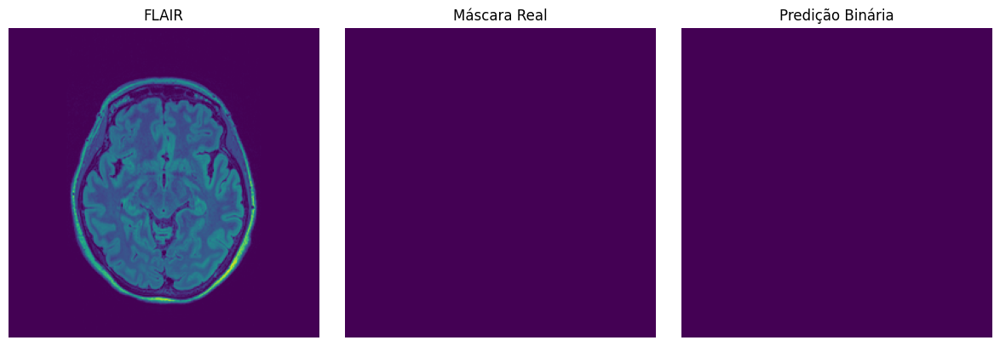

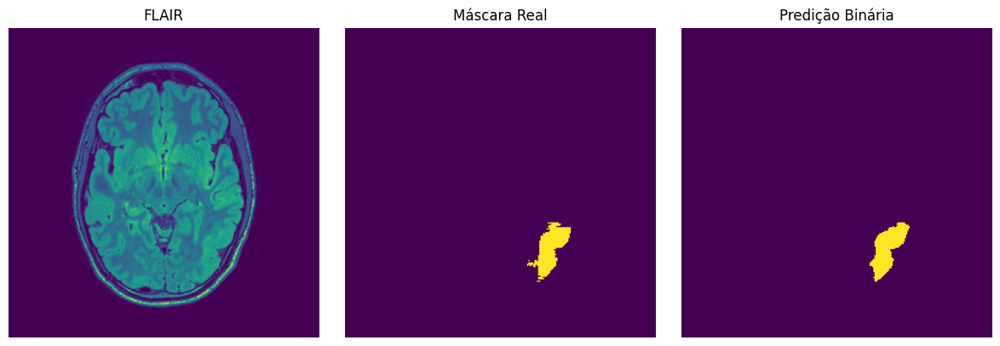

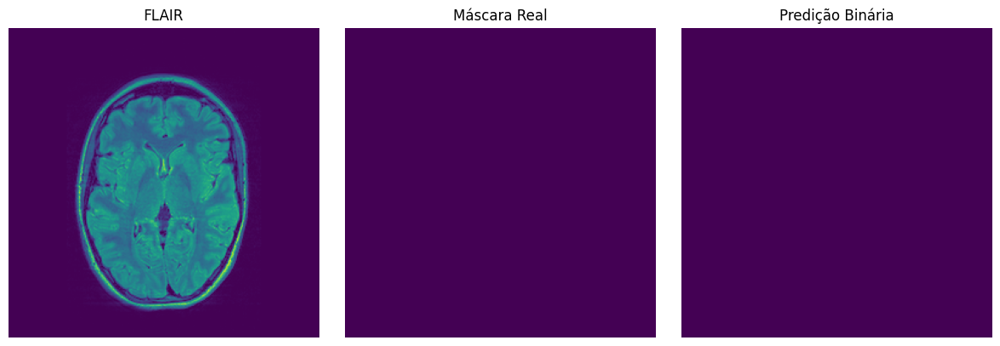

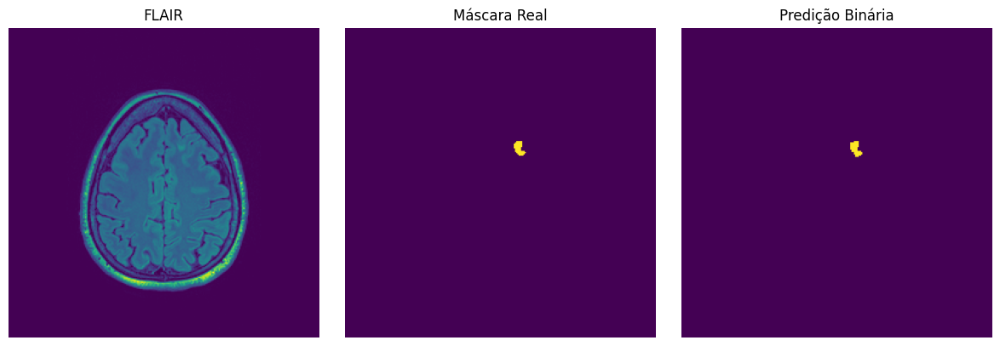

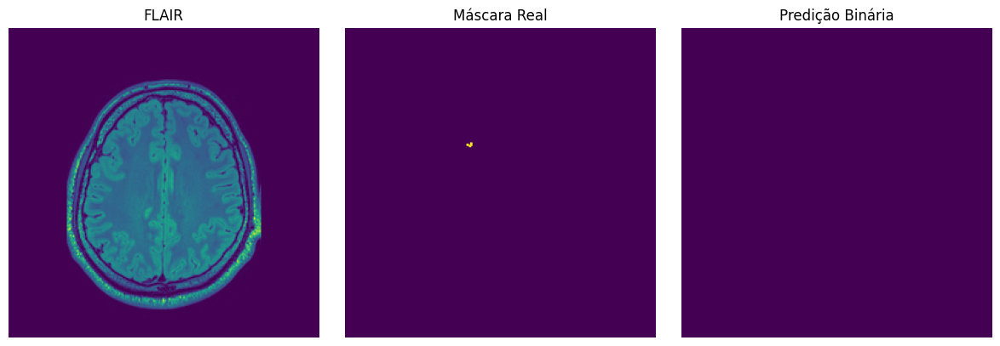

...

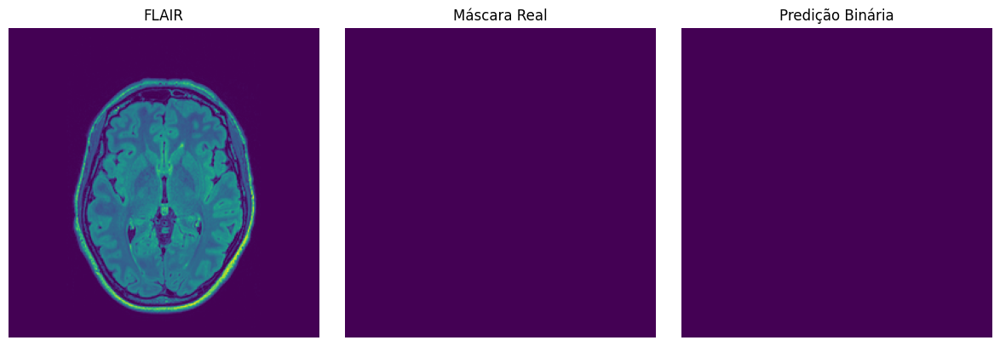

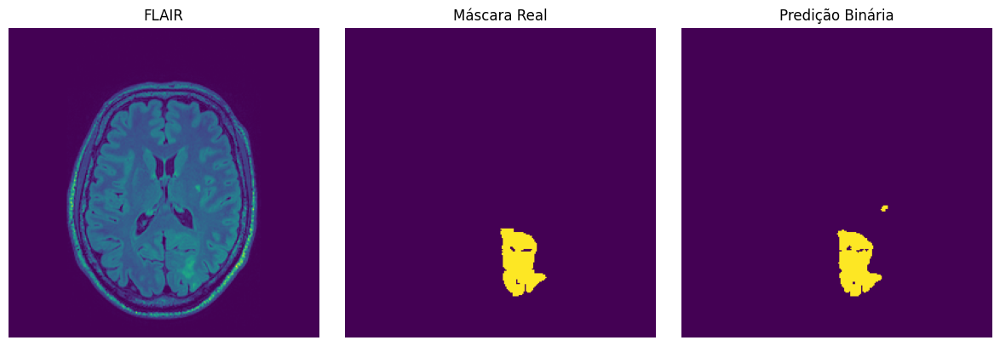

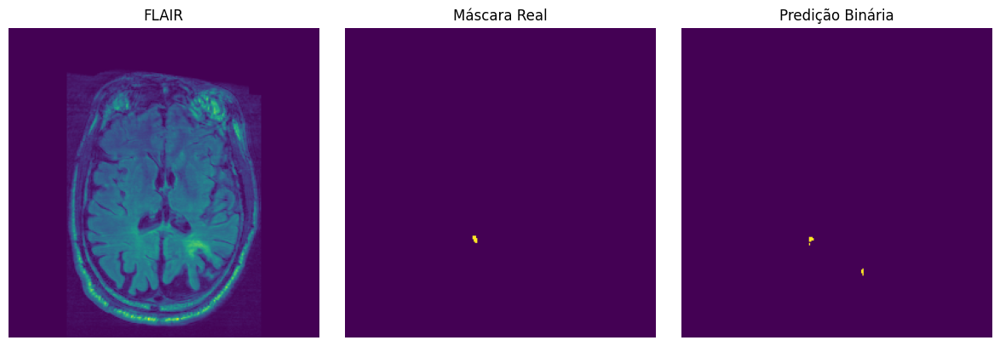

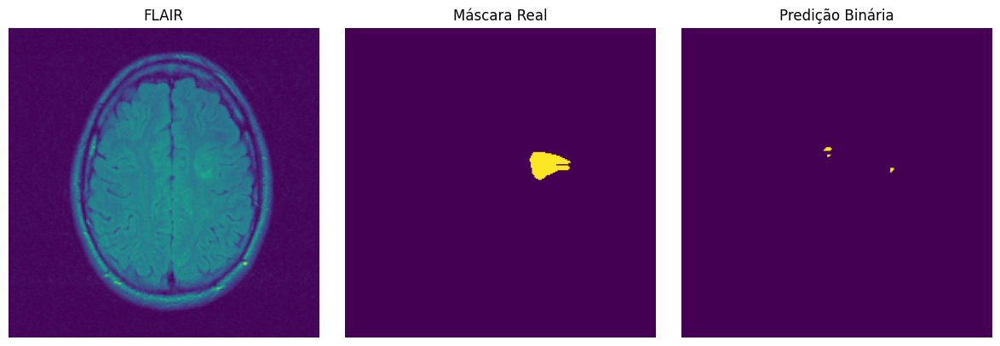

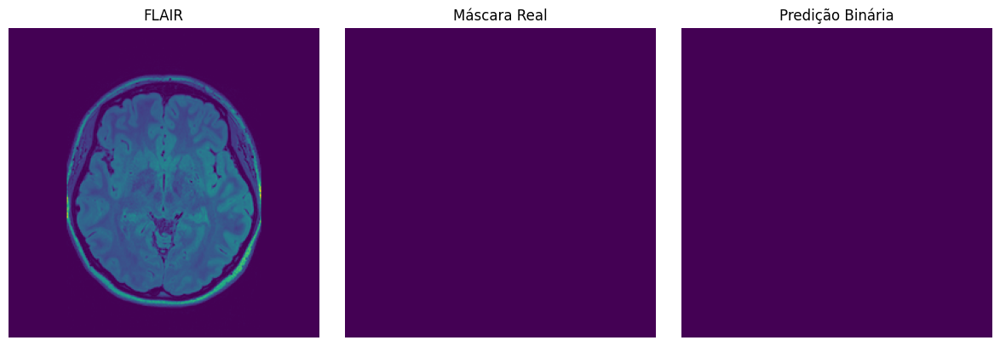

In [ ]:
# Plot de slices para visualização das predições durante o treino
fold_num = 1

X_val = np.load(f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold_num}/X_val.npy")
Y_val = np.load(f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold_num}/Y_val.npy")
Y_pred = np.load(f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold_num}/Y_pred.npy")

# Visualização de 20 slices aleatórias
for i in range(20):
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.title("FLAIR")
    plt.imshow(X_val[i].squeeze(), cmap='viridis')
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.title("Máscara Real")
    plt.imshow(Y_val[i].squeeze(), cmap='viridis')
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.title("Predição Binária")
    plt.imshow(Y_pred[i].squeeze(), cmap='viridis')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# **Gráficos U-Net**


🔍 Análise qualitativa - Fold 1


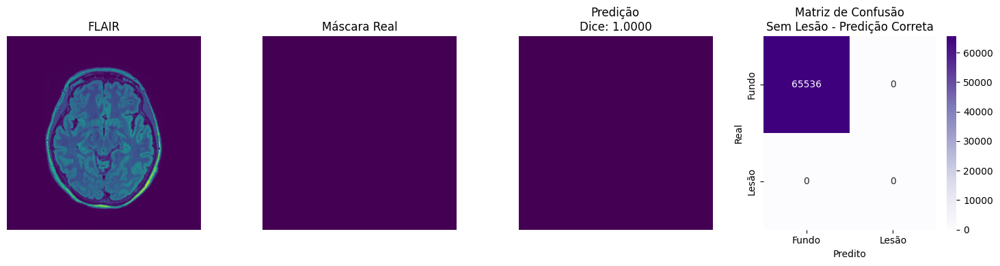

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


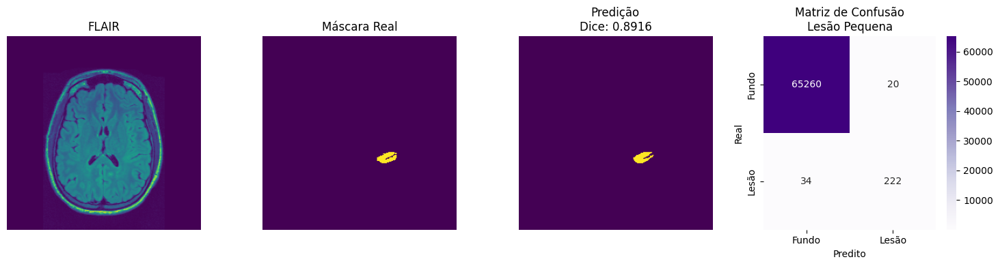

Dice: 0.8916, IoU: 0.8043, Recall: 0.8672, Precision: 0.9174, F1: 0.8916


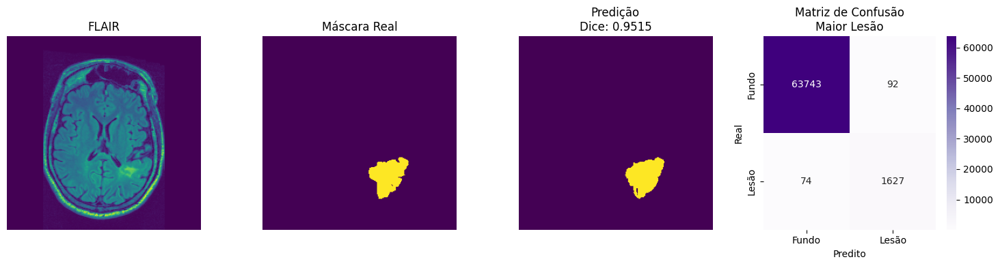

Dice: 0.9515, IoU: 0.9074, Recall: 0.9565, Precision: 0.9465, F1: 0.9515


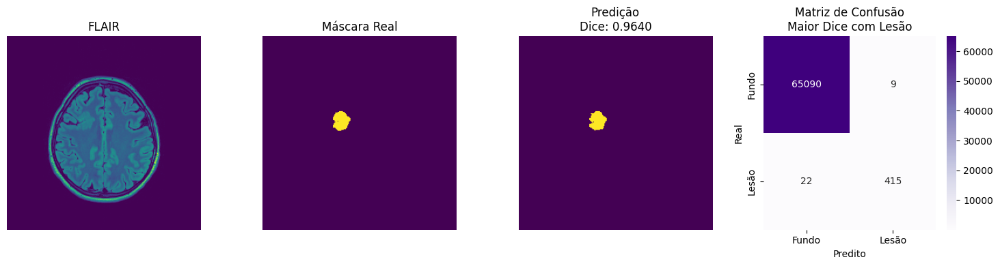

Dice: 0.9640, IoU: 0.9305, Recall: 0.9497, Precision: 0.9788, F1: 0.9640

🔍 Análise qualitativa - Fold 2


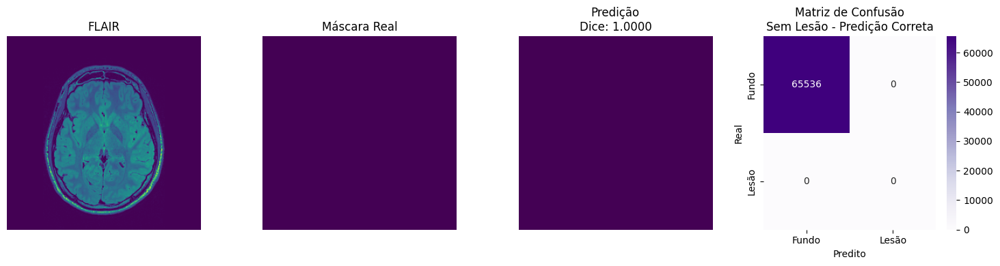

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


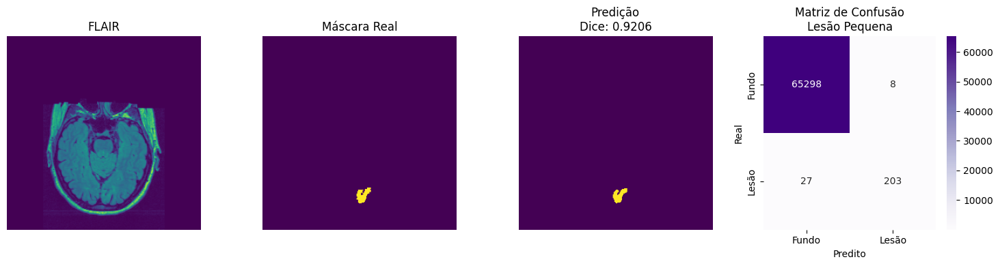

Dice: 0.9206, IoU: 0.8529, Recall: 0.8826, Precision: 0.9621, F1: 0.9206


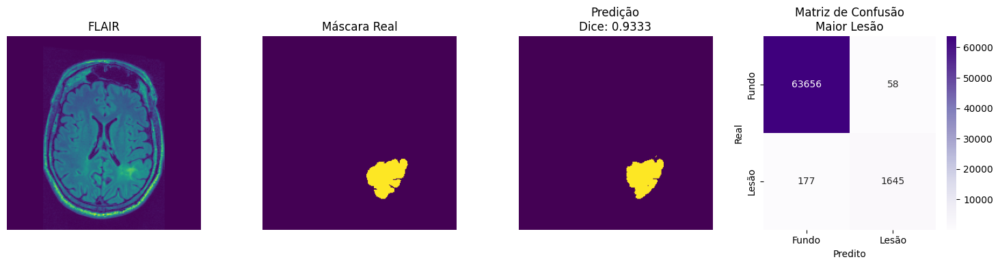

Dice: 0.9333, IoU: 0.8750, Recall: 0.9029, Precision: 0.9659, F1: 0.9333


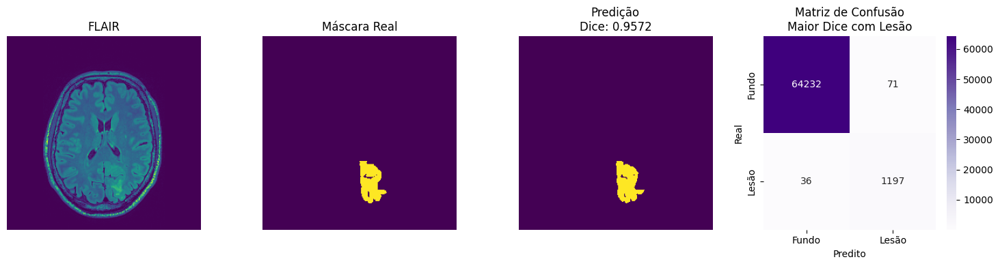

Dice: 0.9572, IoU: 0.9179, Recall: 0.9708, Precision: 0.9440, F1: 0.9572

🔍 Análise qualitativa - Fold 3


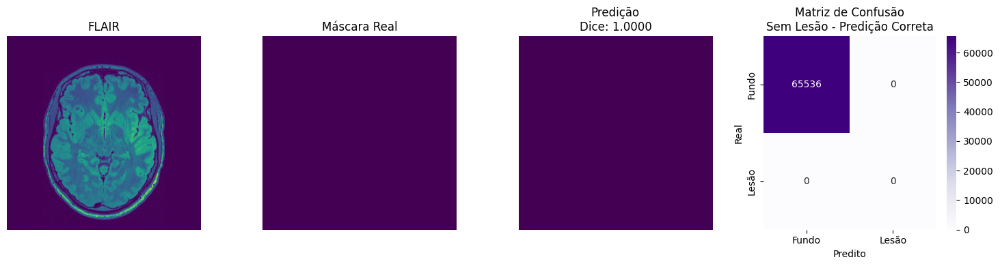

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


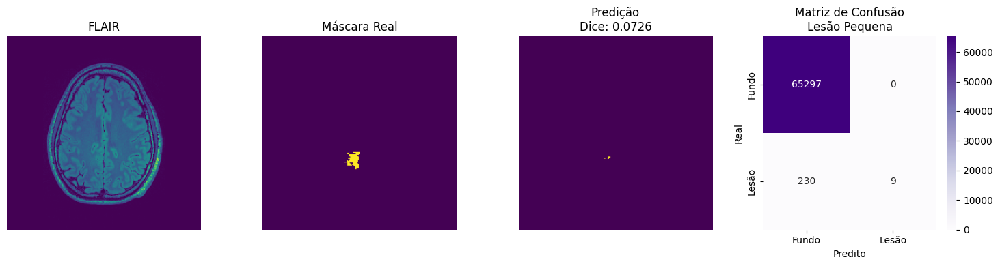

Dice: 0.0726, IoU: 0.0377, Recall: 0.0377, Precision: 1.0000, F1: 0.0726


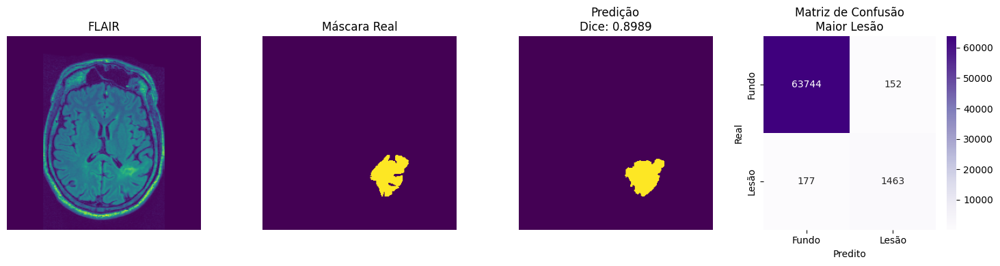

Dice: 0.8989, IoU: 0.8164, Recall: 0.8921, Precision: 0.9059, F1: 0.8989


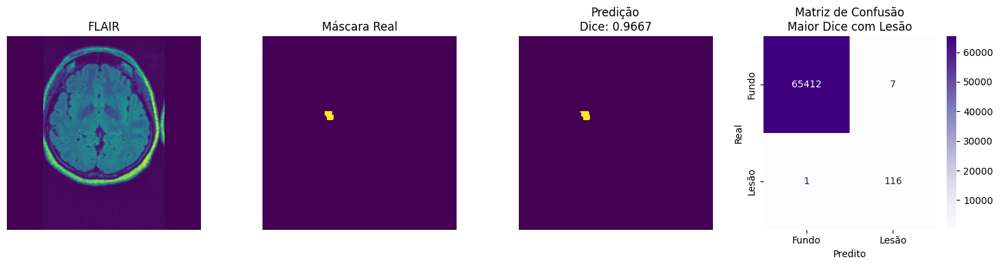

Dice: 0.9667, IoU: 0.9355, Recall: 0.9915, Precision: 0.9431, F1: 0.9667

🔍 Análise qualitativa - Fold 4


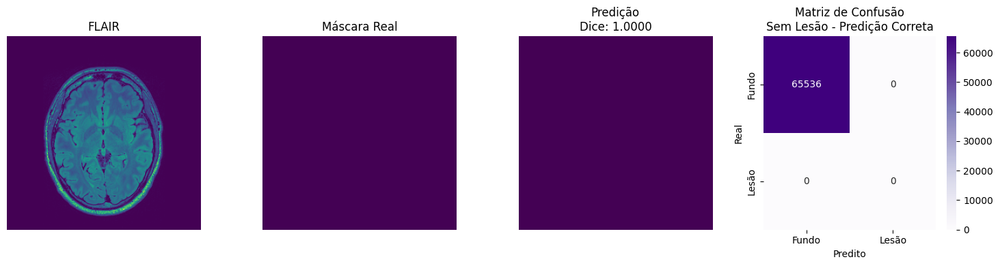

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


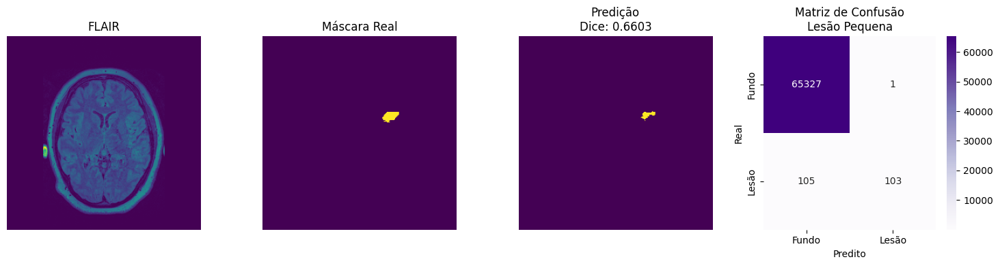

Dice: 0.6603, IoU: 0.4928, Recall: 0.4952, Precision: 0.9904, F1: 0.6603


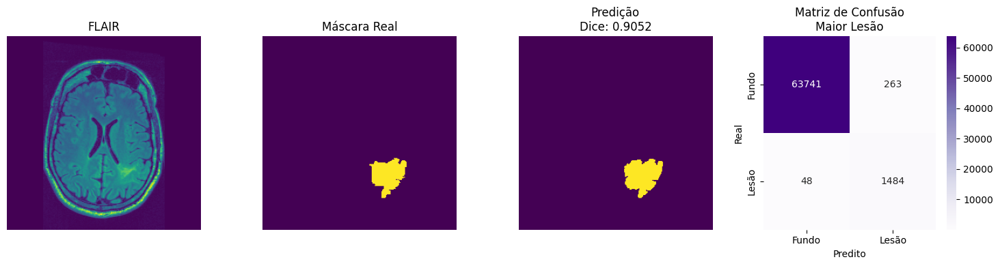

Dice: 0.9052, IoU: 0.8267, Recall: 0.9687, Precision: 0.8495, F1: 0.9052


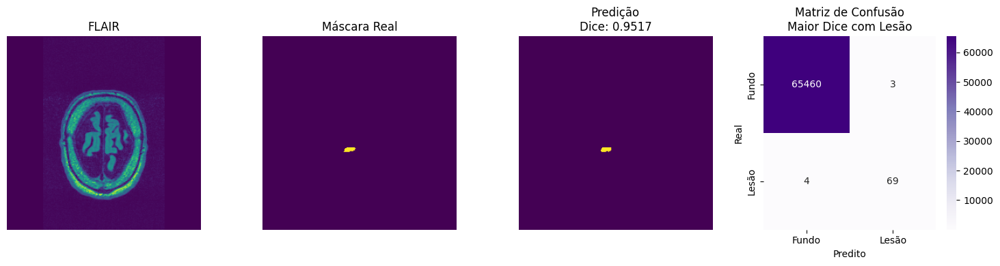

Dice: 0.9517, IoU: 0.9079, Recall: 0.9452, Precision: 0.9583, F1: 0.9517

🔍 Análise qualitativa - Fold 5


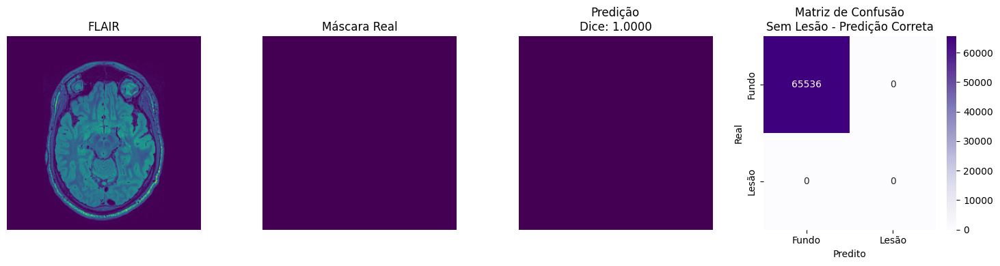

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


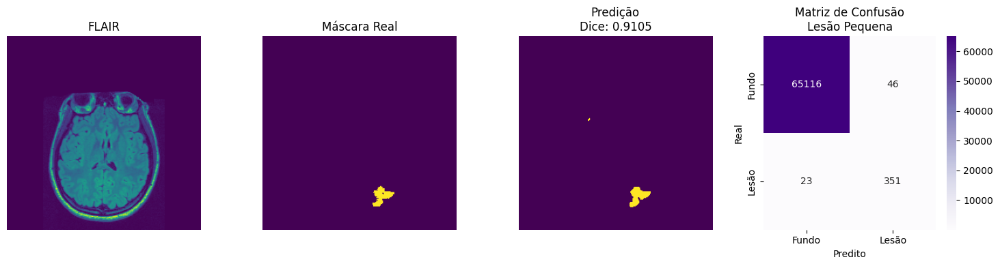

Dice: 0.9105, IoU: 0.8357, Recall: 0.9385, Precision: 0.8841, F1: 0.9105


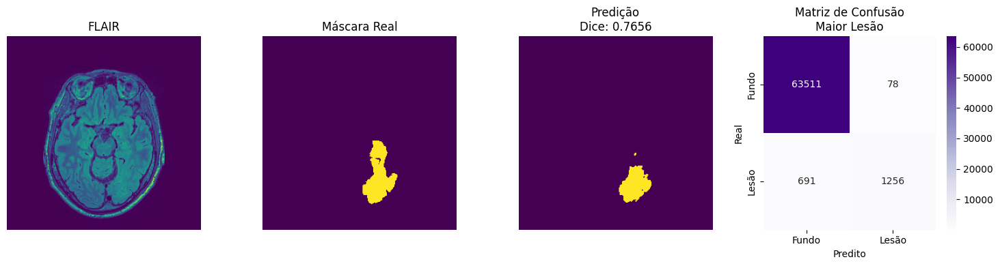

Dice: 0.7656, IoU: 0.6202, Recall: 0.6451, Precision: 0.9415, F1: 0.7656


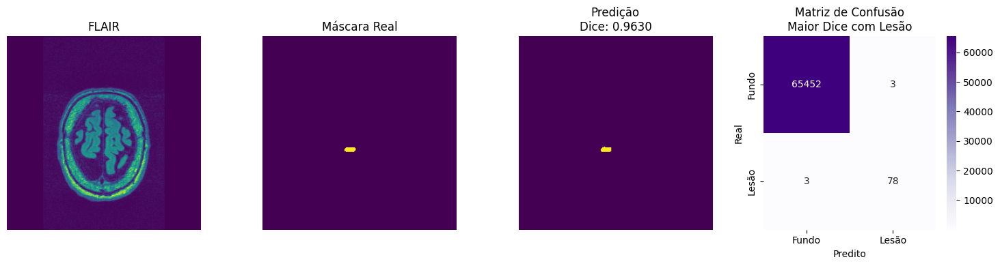

Dice: 0.9630, IoU: 0.9286, Recall: 0.9630, Precision: 0.9630, F1: 0.9630


In [ ]:
# Análise qualitativa
def analyze_saved_fold(fold_dir, fold_number):
    # Carrega os dados
    X_val = np.load(os.path.join(fold_dir, "X_val.npy"))
    Y_val = np.load(os.path.join(fold_dir, "Y_val.npy"))
    Y_pred = np.load(os.path.join(fold_dir, "Y_pred.npy"))

    print(f"\n🔍 Análise qualitativa - Fold {fold_number}")

    def calculate_all_metrics(y_true, y_pred):
        cm = confusion_matrix(y_true.flatten(), y_pred.flatten(), labels=[0,1])
        precision = precision_score(y_true.flatten(), y_pred.flatten(), zero_division=0)
        recall = recall_score(y_true.flatten(), y_pred.flatten(), zero_division=0)
        f1 = f1_score(y_true.flatten(), y_pred.flatten(), zero_division=0)
        iou = jaccard_score(y_true.flatten(), y_pred.flatten(), zero_division=0)
        dice = dice_score(y_true, y_pred)
        return cm, dice, iou, recall, precision, f1

    def plot_case_unet(idx, title_extra=''):
        flair = X_val[idx].squeeze()
        mask_true = Y_val[idx].squeeze()
        pred_bin = Y_pred[idx].squeeze()

        cm, dice, iou, recall, precision, f1 = calculate_all_metrics(mask_true, pred_bin)

        plt.figure(figsize=(15, 4))
        plt.subplot(1, 4, 1)
        plt.title("FLAIR")
        plt.imshow(flair, cmap='viridis')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.title("Máscara Real")
        plt.imshow(mask_true, cmap='viridis')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.title(f"Predição\nDice: {dice:.4f}")
        plt.imshow(pred_bin, cmap='viridis')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', xticklabels=['Fundo', 'Lesão'], yticklabels=['Fundo', 'Lesão'])
        plt.title(f"Matriz de Confusão\n{title_extra}")
        plt.xlabel("Predito")
        plt.ylabel("Real")

        plt.tight_layout()
        plt.show()

        print(f"Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

    # Calcula por slice
    lesion_pixels_per_slice = np.array([np.sum(mask > 0) for mask in Y_val])
    dice_per_slice = np.array([dice_score(Y_val[i], Y_pred[i]) for i in range(len(Y_val))])

    # Caso 1: Sem lesão e predição correta
    no_lesion_cases = np.where(lesion_pixels_per_slice == 0)[0]
    valid_no_lesion = [i for i in no_lesion_cases if np.sum(Y_pred[i]) == 0]
    if valid_no_lesion:
        plot_case_unet(valid_no_lesion[0], title_extra="Sem Lesão - Predição Correta")

    # Caso 2: Lesão pequena
    lesion_small = np.where((lesion_pixels_per_slice > 200) & (lesion_pixels_per_slice < 400))[0]
    if len(lesion_small) > 0:
        plot_case_unet(lesion_small[0], title_extra="Lesão Pequena")

    # Caso 3: Maior lesão
    plot_case_unet(np.argmax(lesion_pixels_per_slice), title_extra="Maior Lesão")

    # Caso 4: Maior Dice
    cases_with_lesion = np.where(lesion_pixels_per_slice > 0)[0]
    if len(cases_with_lesion) > 0:
        idx_best_dice = cases_with_lesion[np.argmax(dice_per_slice[cases_with_lesion])]
        plot_case_unet(idx_best_dice, title_extra="Maior Dice com Lesão")

for i in range(1, 6):
    fold_path = f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{i}"
    analyze_saved_fold(fold_path, i)

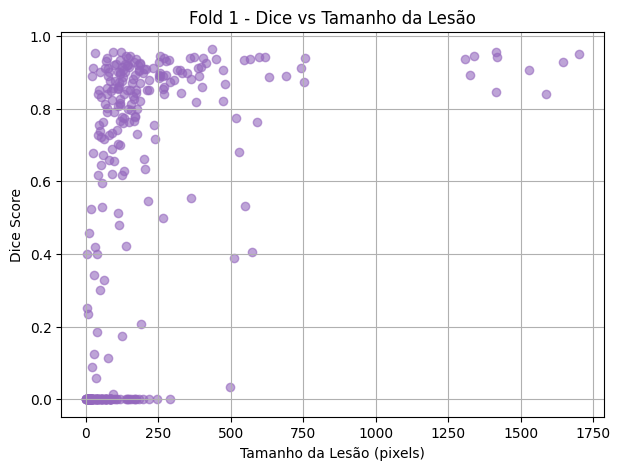

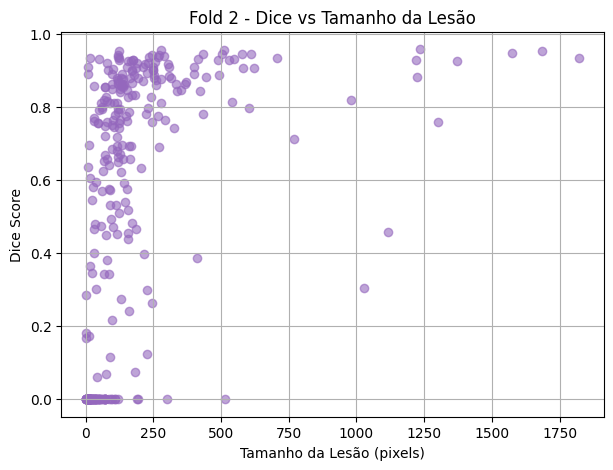

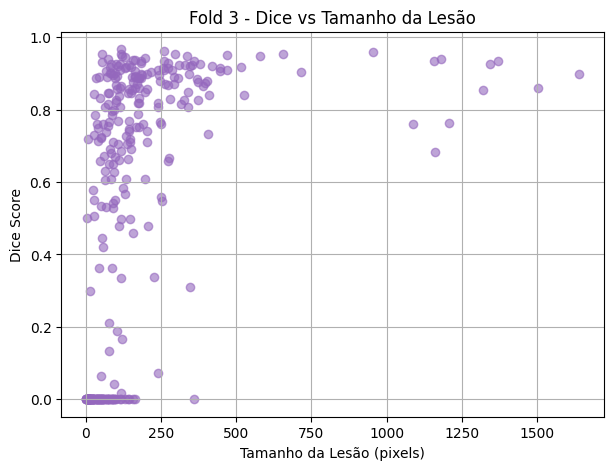

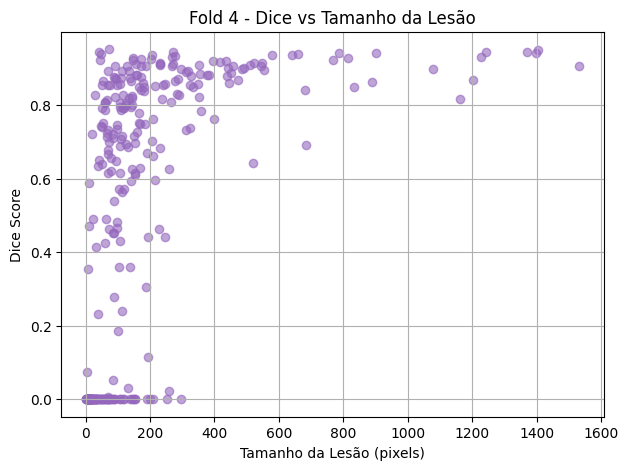

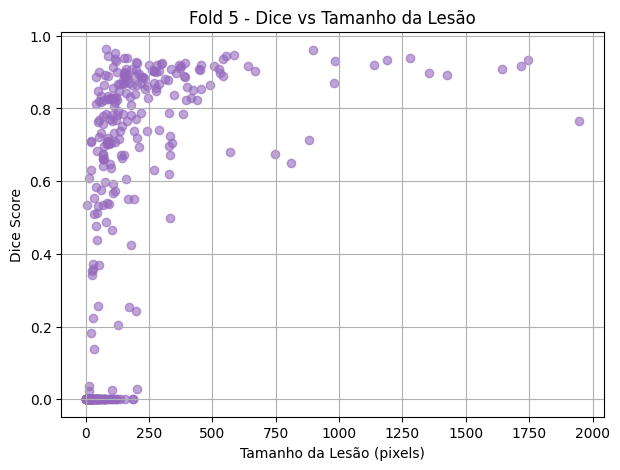

In [ ]:
# Plot scatter por fold
for fold in range(1, 6):
    path = f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold}"
    Y_val = np.load(f"{path}/Y_val.npy")
    Y_pred = np.load(f"{path}/Y_pred.npy")

    lesion_sizes = []
    dice_scores = []

    for i in range(len(Y_val)):
        true_mask = Y_val[i].squeeze()
        pred_mask = Y_pred[i].squeeze()
        lesion_size = np.sum(true_mask > 0)
        dice = dice_score(true_mask, pred_mask)
        if lesion_size > 0:
            lesion_sizes.append(lesion_size)
            dice_scores.append(dice)

    # Plot individual por fold
    plt.figure(figsize=(7,5))
    plt.scatter(lesion_sizes, dice_scores, alpha=0.6, color='tab:purple')
    plt.title(f"Fold {fold} - Dice vs Tamanho da Lesão")
    plt.xlabel("Tamanho da Lesão (pixels)")
    plt.ylabel("Dice Score")
    plt.grid(True)
    plt.show()


Fold 1:


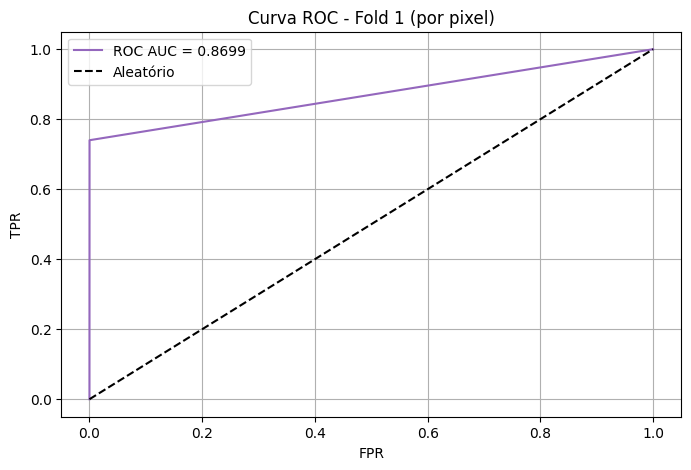

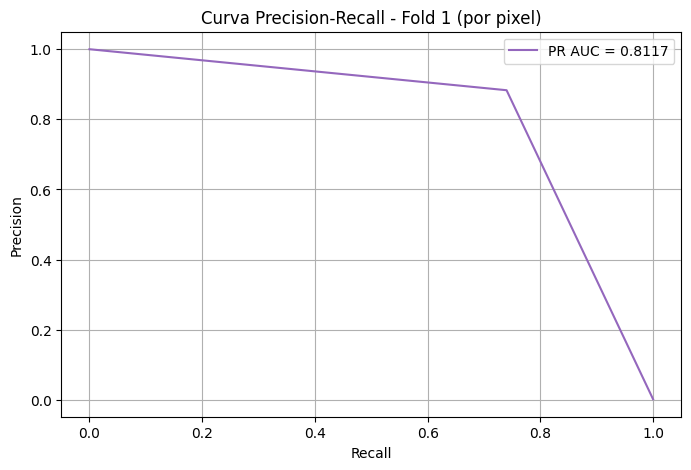

✔️ AUC ROC: 0.8699 | AUC PR: 0.8117

Fold 2:


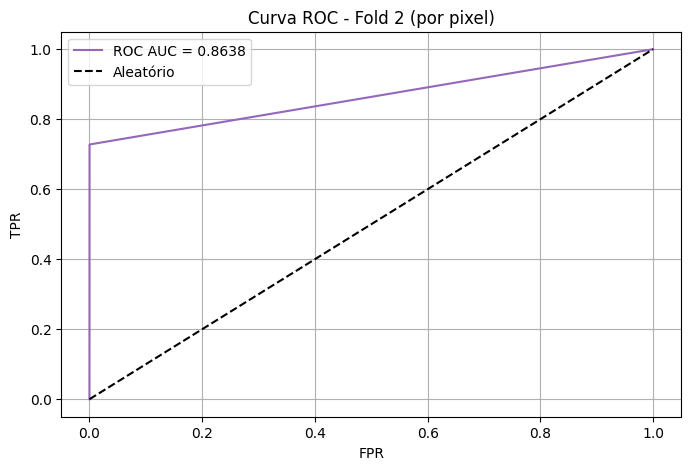

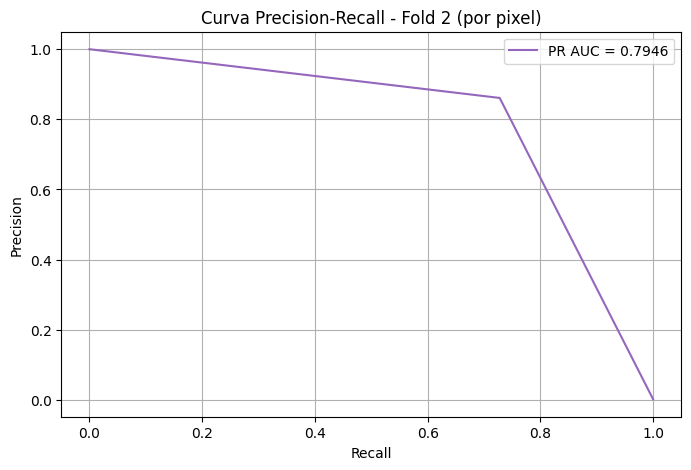

✔️ AUC ROC: 0.8638 | AUC PR: 0.7946

Fold 3:


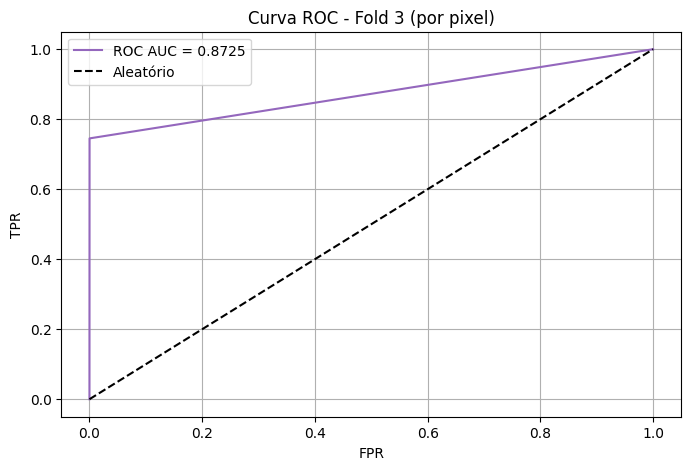

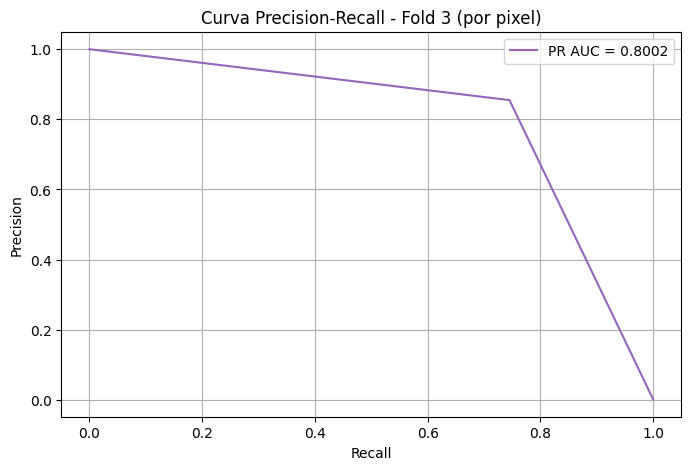

✔️ AUC ROC: 0.8725 | AUC PR: 0.8002

Fold 4:


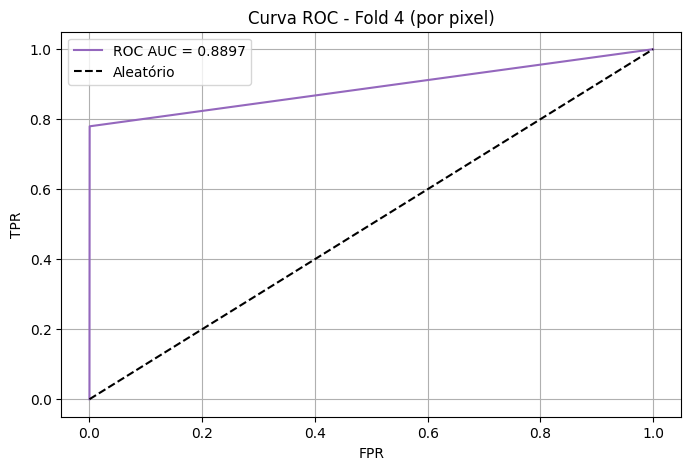

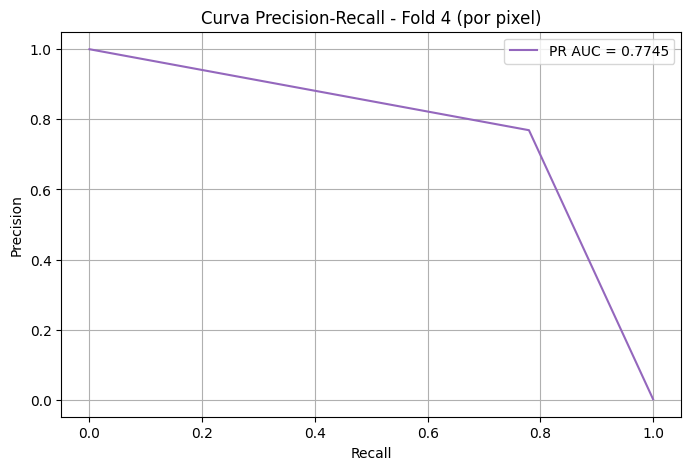

✔️ AUC ROC: 0.8897 | AUC PR: 0.7745

Fold 5:


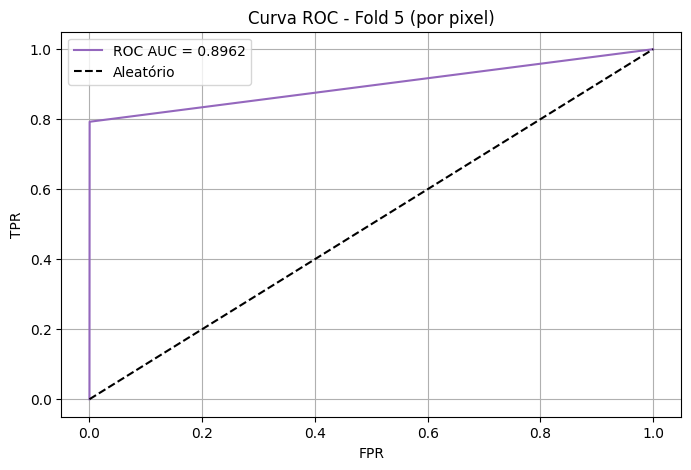

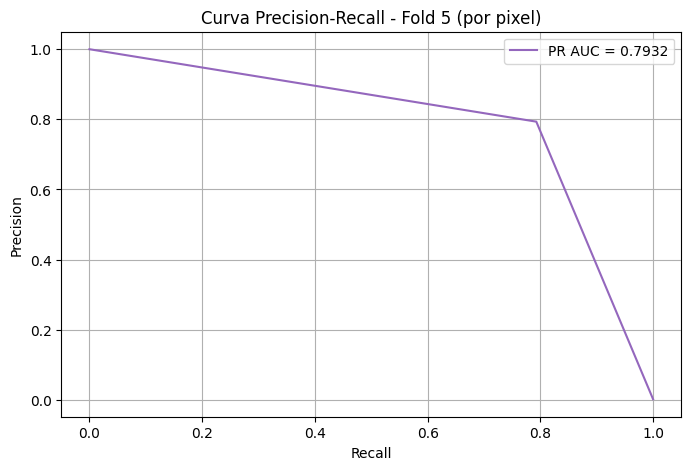

✔️ AUC ROC: 0.8962 | AUC PR: 0.7932


In [ ]:
# Plot curva roc e precision-recall
for fold in range(1, 6):
    print(f"\nFold {fold}:")

    path = f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold}"
    Y_val = np.load(f"{path}/Y_val.npy").flatten()
    Y_probs = np.load(f"{path}/Y_pred.npy").flatten()

    # ROC Curve
    fpr, tpr, _ = roc_curve(Y_val, Y_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 5))
    plt.plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.4f}', color='tab:purple')
    plt.plot([0, 1], [0, 1], 'k--', label='Aleatório')
    plt.title(f'Curva ROC - Fold {fold} (por pixel)')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend()
    plt.grid()
    plt.show()

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(Y_val, Y_probs)
    pr_auc = auc(recall, precision)

    plt.figure(figsize=(8, 5))
    plt.plot(recall, precision, label=f'PR AUC = {pr_auc:.4f}', color='tab:purple')
    plt.title(f'Curva Precision-Recall - Fold {fold} (por pixel)')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid()
    plt.show()

    print(f"✔️ AUC ROC: {roc_auc:.4f} | AUC PR: {pr_auc:.4f}")


🔍 Fold 1


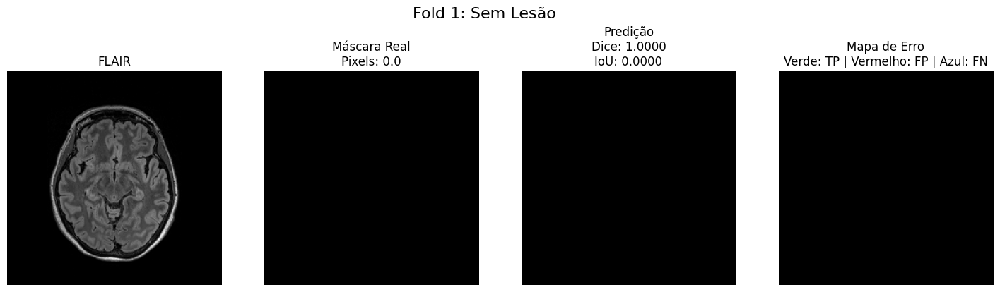

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


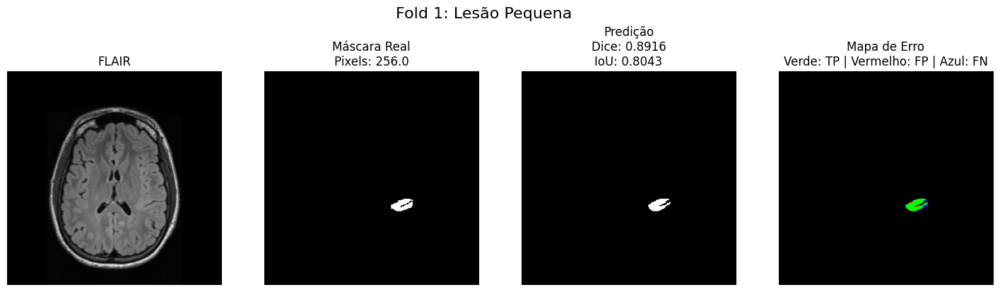

Dice: 0.8916, IoU: 0.8043, Recall: 0.8672, Precision: 0.9174, F1: 0.8916


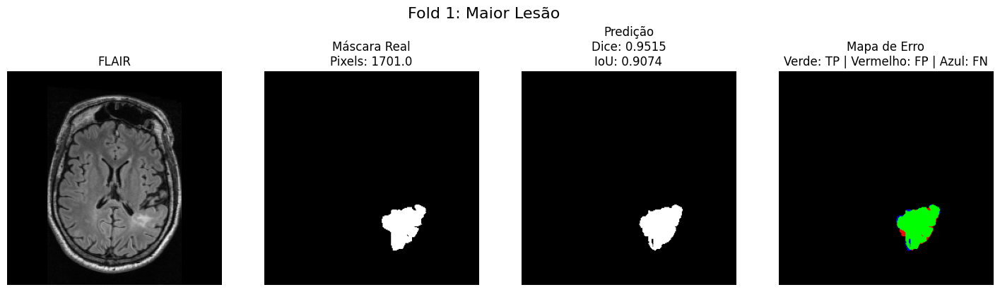

Dice: 0.9515, IoU: 0.9074, Recall: 0.9565, Precision: 0.9465, F1: 0.9515


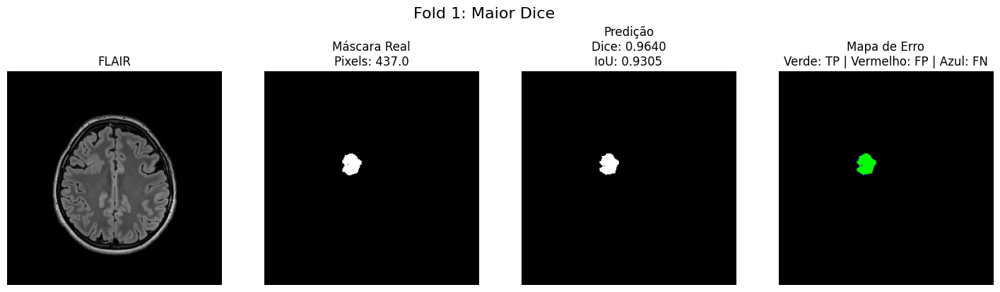

Dice: 0.9640, IoU: 0.9305, Recall: 0.9497, Precision: 0.9788, F1: 0.9640

🔍 Fold 2


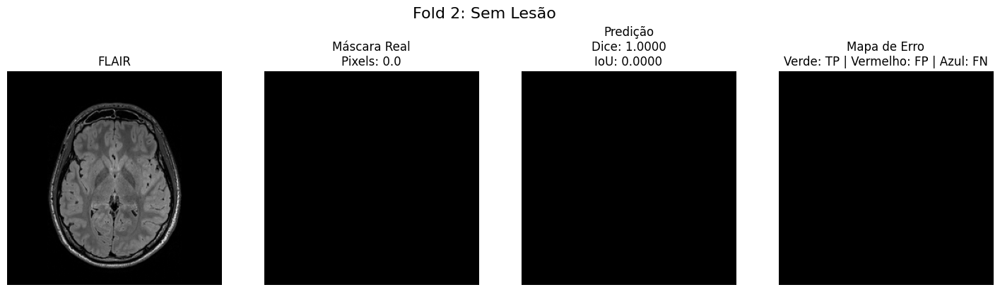

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


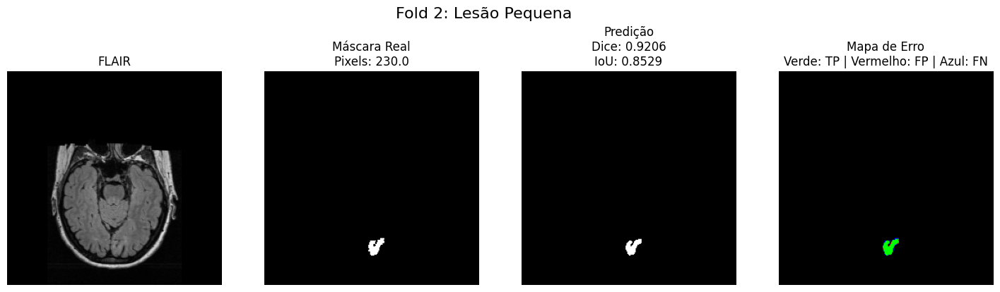

Dice: 0.9206, IoU: 0.8529, Recall: 0.8826, Precision: 0.9621, F1: 0.9206


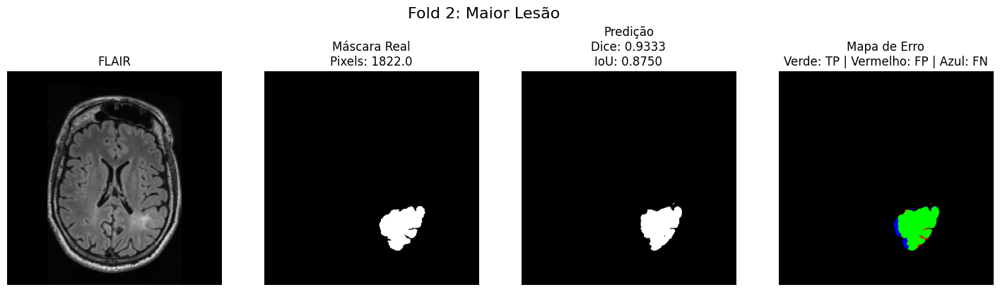

Dice: 0.9333, IoU: 0.8750, Recall: 0.9029, Precision: 0.9659, F1: 0.9333


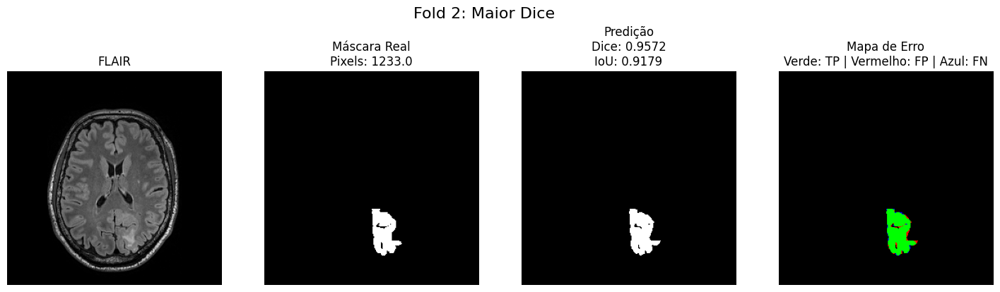

Dice: 0.9572, IoU: 0.9179, Recall: 0.9708, Precision: 0.9440, F1: 0.9572

🔍 Fold 3


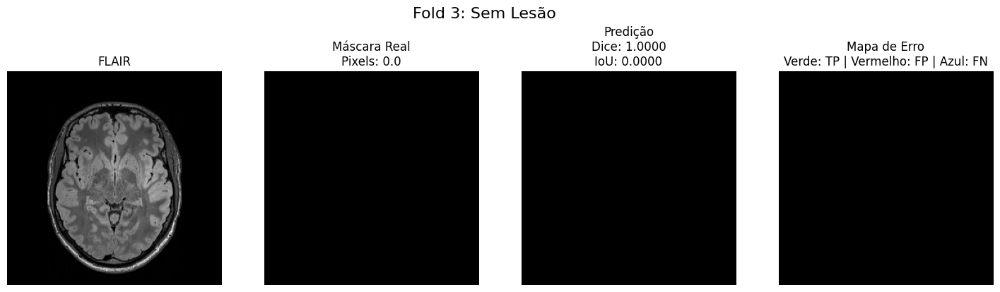

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


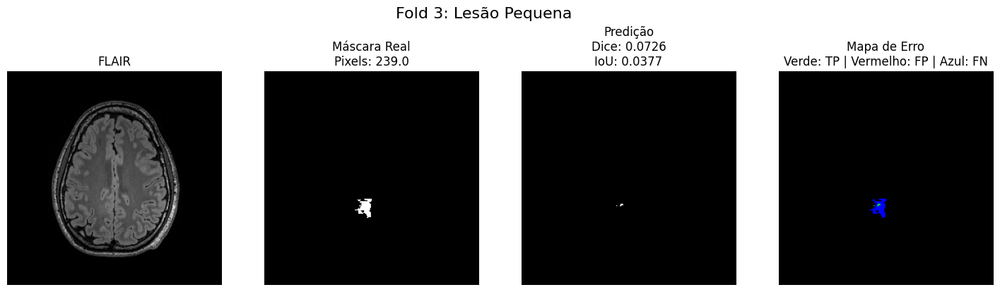

Dice: 0.0726, IoU: 0.0377, Recall: 0.0377, Precision: 1.0000, F1: 0.0726


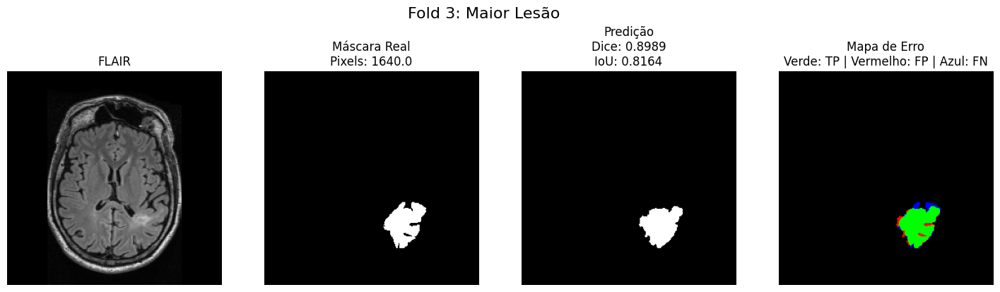

Dice: 0.8989, IoU: 0.8164, Recall: 0.8921, Precision: 0.9059, F1: 0.8989


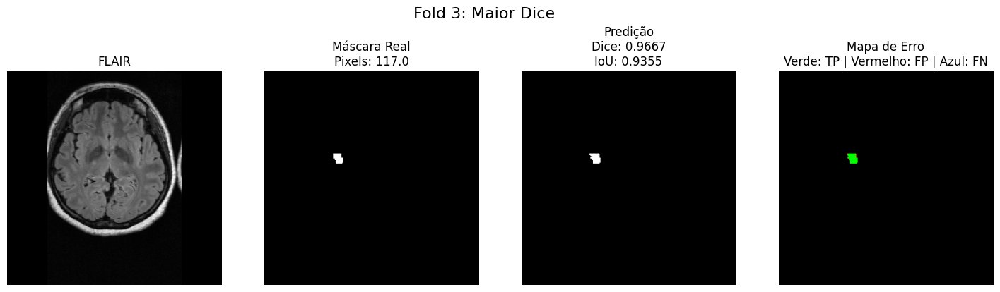

Dice: 0.9667, IoU: 0.9355, Recall: 0.9915, Precision: 0.9431, F1: 0.9667

🔍 Fold 4


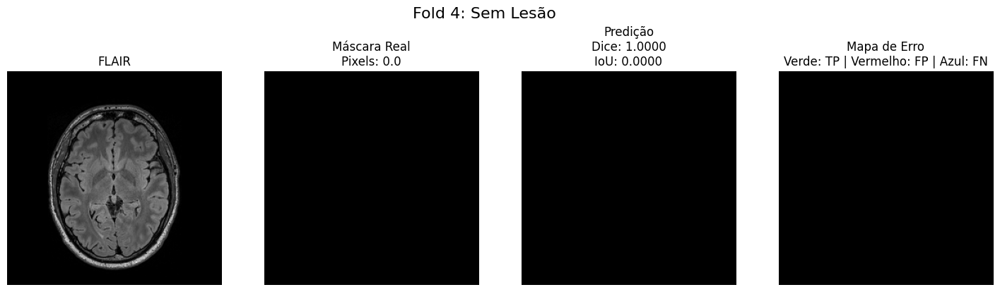

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


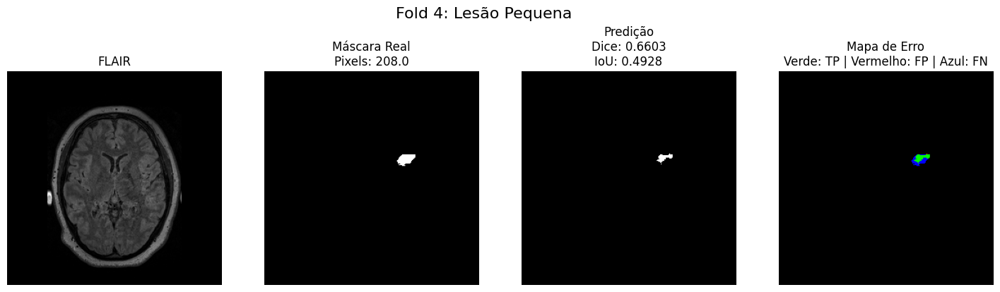

Dice: 0.6603, IoU: 0.4928, Recall: 0.4952, Precision: 0.9904, F1: 0.6603


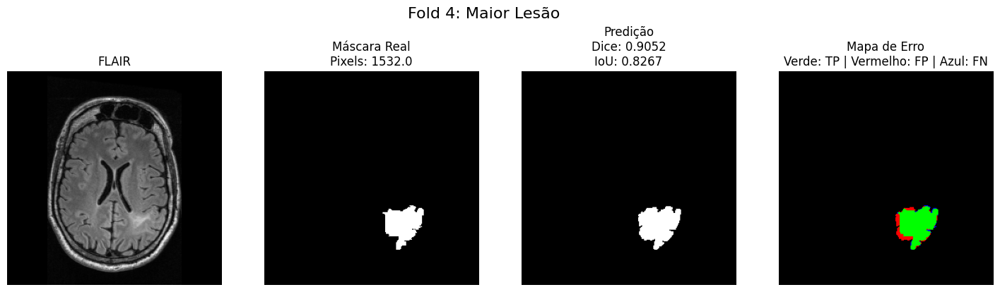

Dice: 0.9052, IoU: 0.8267, Recall: 0.9687, Precision: 0.8495, F1: 0.9052


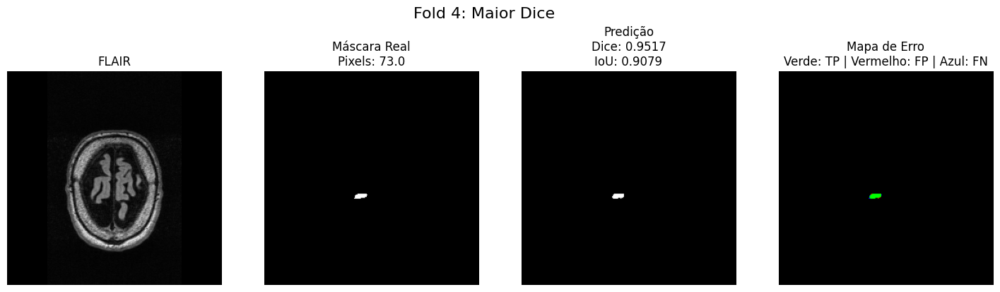

Dice: 0.9517, IoU: 0.9079, Recall: 0.9452, Precision: 0.9583, F1: 0.9517

🔍 Fold 5


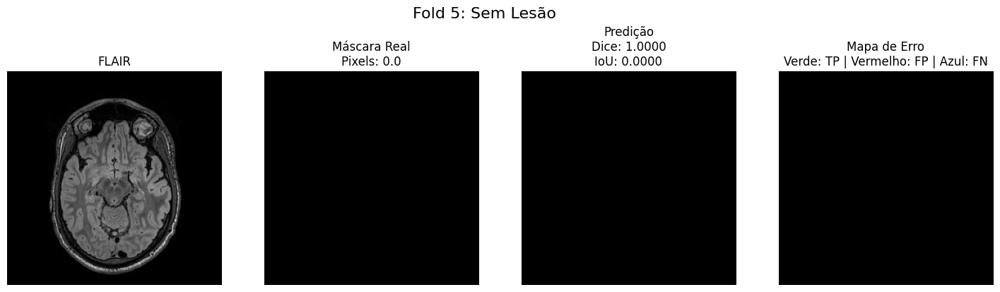

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


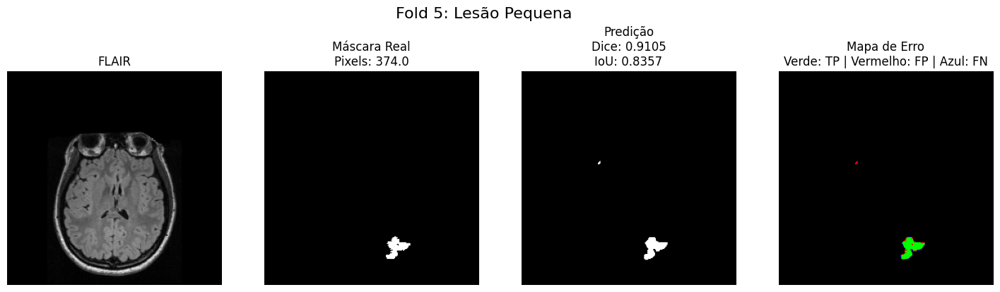

Dice: 0.9105, IoU: 0.8357, Recall: 0.9385, Precision: 0.8841, F1: 0.9105


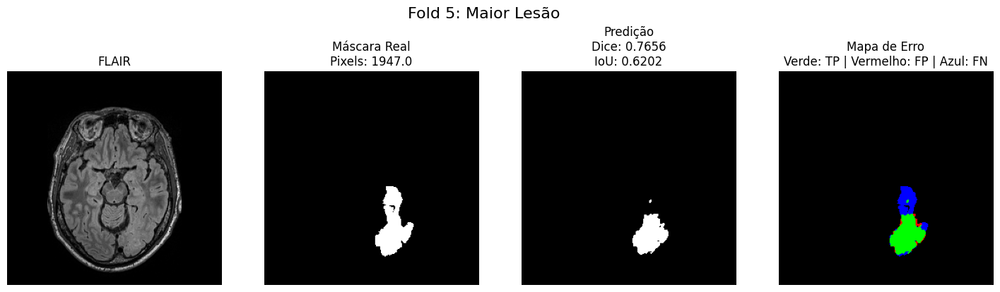

Dice: 0.7656, IoU: 0.6202, Recall: 0.6451, Precision: 0.9415, F1: 0.7656


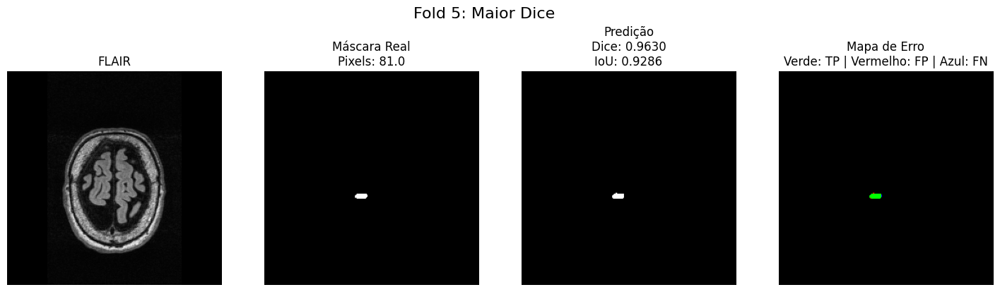

Dice: 0.9630, IoU: 0.9286, Recall: 0.9630, Precision: 0.9630, F1: 0.9630


In [ ]:
# Plot qualitativo com mapa de erro
def plot_case_qualitativo(x, y_true, y_prob, idx, title_extra=''):
    flair = x[idx].squeeze()
    mask_true = y_true[idx].squeeze()
    pred_probs = y_prob[idx].squeeze()
    pred_bin = (pred_probs > 0.6).astype(np.uint8)

    # Métricas
    cm = confusion_matrix(mask_true.flatten(), pred_bin.flatten(), labels=[0, 1])
    dice = dice_score(mask_true, pred_bin)
    iou = jaccard_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
    recall = recall_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
    precision = precision_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
    f1 = f1_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)

    # Mapa de erro colorido
    intersection = np.logical_and(mask_true == 1, pred_bin == 1)
    false_positive = np.logical_and(mask_true == 0, pred_bin == 1)
    false_negative = np.logical_and(mask_true == 1, pred_bin == 0)
    error_map = np.zeros((*mask_true.shape, 3), dtype=np.uint8)
    error_map[intersection] = [0, 255, 0]
    error_map[false_positive] = [255, 0, 0]
    error_map[false_negative] = [0, 0, 255]

    # Plot
    plt.figure(figsize=(18, 5))
    plt.subplot(1, 4, 1)
    plt.title("FLAIR")
    plt.imshow(flair, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title(f"Máscara Real\nPixels: {np.sum(mask_true)}")
    plt.imshow(mask_true, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title(f"Predição\nDice: {dice:.4f}\nIoU: {iou:.4f}")
    plt.imshow(pred_bin, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Mapa de Erro\nVerde: TP | Vermelho: FP | Azul: FN")
    plt.imshow(error_map)
    plt.axis('off')

    plt.suptitle(title_extra, fontsize=16)
    plt.show()

    print(f"Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

# Loop por fold
for fold in range(1, 6):
    print(f"\n🔍 Fold {fold}")

    # Carrega os dados
    path = f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold}"
    X_val = np.load(f"{path}/X_val.npy")
    Y_val = np.load(f"{path}/Y_val.npy")
    Y_pred = np.load(f"{path}/Y_pred.npy")

    lesion_pixels = np.array([np.sum(y) for y in Y_val])
    dice_scores = np.array([
        dice_score(Y_val[i].squeeze(), (Y_pred[i].squeeze() > 0.6).astype(np.uint8))
        for i in range(len(Y_val))
    ])

    # Caso 1 – Sem lesão e fundo predito corretamente
    no_lesion = np.where(lesion_pixels == 0)[0]
    correct_bg = [i for i in no_lesion if np.sum((Y_pred[i].squeeze() > 0.6)) == 0]
    if correct_bg:
        plot_case_qualitativo(X_val, Y_val, Y_pred, correct_bg[0], title_extra='Fold {}: Sem Lesão'.format(fold))

    # Caso 2 – Lesão pequena
    small_lesion = np.where((lesion_pixels > 200) & (lesion_pixels < 400))[0]
    if len(small_lesion) > 0:
        plot_case_qualitativo(X_val, Y_val, Y_pred, small_lesion[0], title_extra='Fold {}: Lesão Pequena'.format(fold))

    # Caso 3 – Maior lesão
    largest_idx = np.argmax(lesion_pixels)
    plot_case_qualitativo(X_val, Y_val, Y_pred, largest_idx, title_extra='Fold {}: Maior Lesão'.format(fold))

    # Caso 4 – Melhor Dice em slice com lesão
    with_lesion = np.where(lesion_pixels > 0)[0]
    if len(with_lesion) > 0:
        best_dice_idx = with_lesion[np.argmax(dice_scores[with_lesion])]
        plot_case_qualitativo(X_val, Y_val, Y_pred, best_dice_idx, title_extra='Fold {}: Maior Dice'.format(fold))


🔍 Fold 1


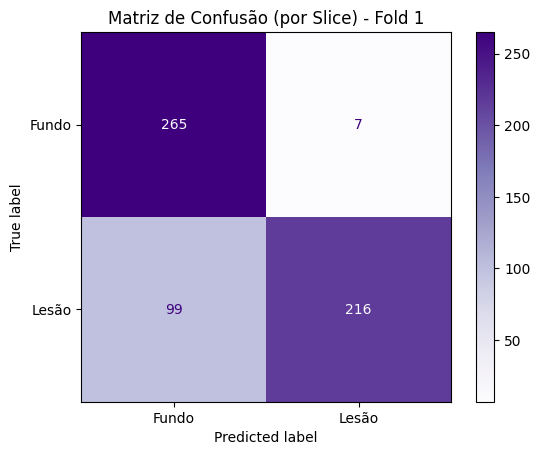


🔍 Fold 2


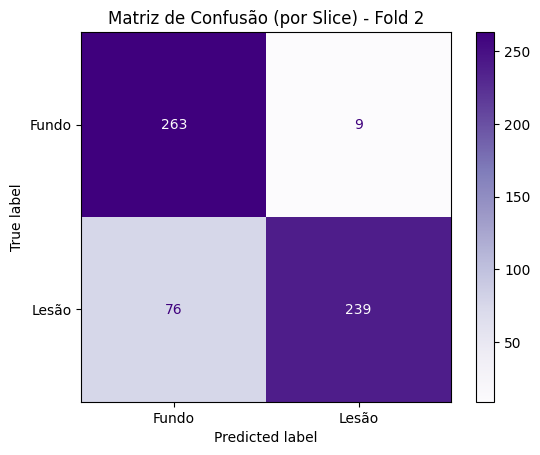


🔍 Fold 3


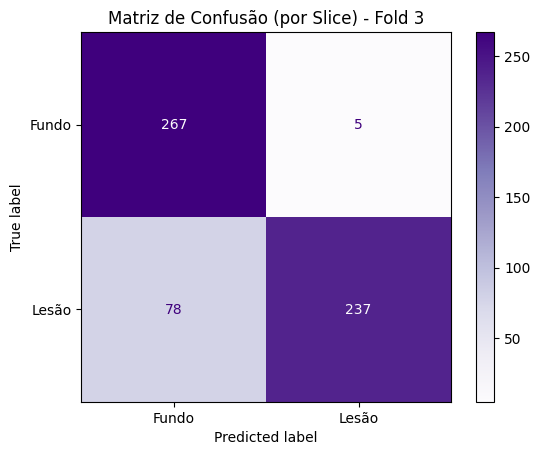


🔍 Fold 4


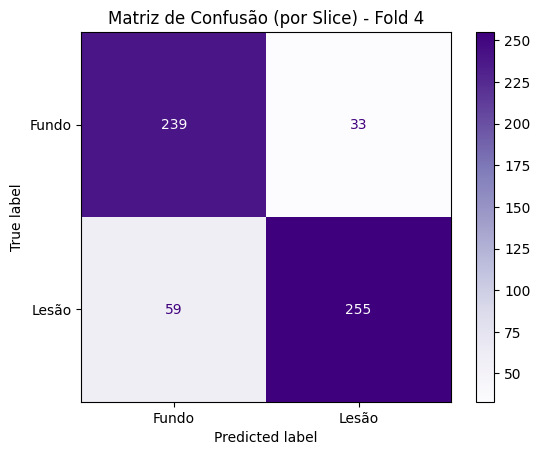


🔍 Fold 5


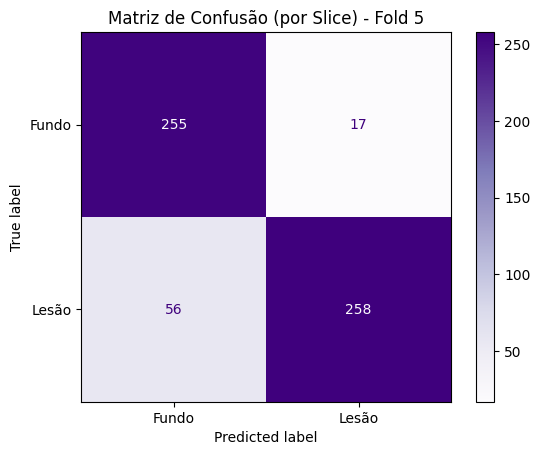

In [ ]:
# Matriz de Confusão (por Slice)
threshold = 0.6

for fold in range(1, 6):
    print(f"\n🔍 Fold {fold}")
    fold_path = f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold}"

    X_val = np.load(f"{fold_path}/X_val.npy")
    Y_val = np.load(f"{fold_path}/Y_val.npy")
    Y_pred = np.load(f"{fold_path}/Y_pred.npy")

    y_true_slice = []
    y_pred_slice = []

    for i in range(len(X_val)):
        mask_true = Y_val[i].squeeze()
        pred_probs = Y_pred[i].squeeze()
        pred_bin = (pred_probs > threshold).astype(np.uint8)

        has_lesion_gt = int(np.sum(mask_true) > 0)
        has_lesion_pred = int(np.sum(pred_bin) > 0)

        y_true_slice.append(has_lesion_gt)
        y_pred_slice.append(has_lesion_pred)

    cm_slice = confusion_matrix(y_true_slice, y_pred_slice, labels=[0, 1])

    disp = ConfusionMatrixDisplay(confusion_matrix=cm_slice, display_labels=["Fundo", "Lesão"])
    disp.plot(cmap='Purples', values_format='d')
    plt.title(f"Matriz de Confusão (por Slice) - Fold {fold}")
    plt.grid(False)
    plt.show()


🔍 Fold 1


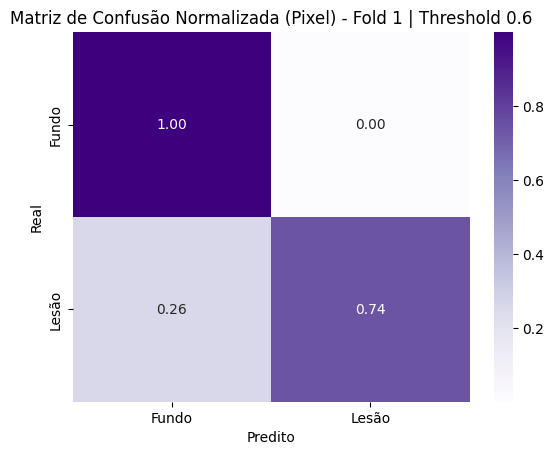


🔍 Fold 2


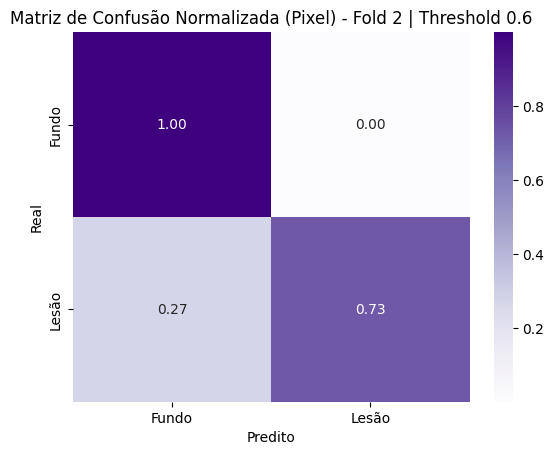


🔍 Fold 3


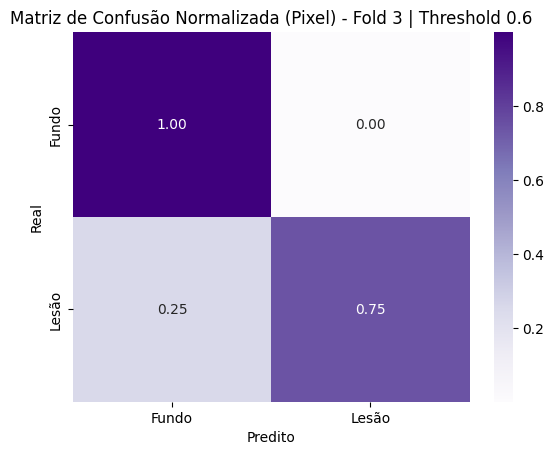


🔍 Fold 4


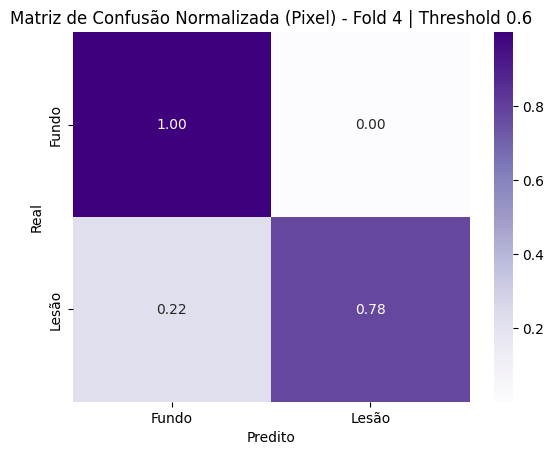


🔍 Fold 5


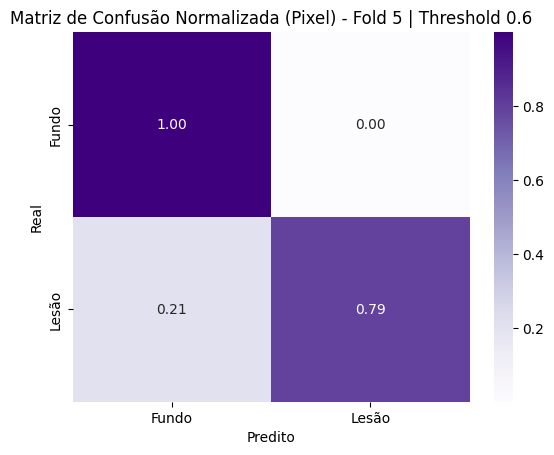

In [ ]:
# Matriz de Confusão Normalizada (Pixel)
threshold = 0.6

for fold in range(1, 6):
    print(f"\n🔍 Fold {fold}")
    fold_path = f"/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/fold{fold}"

    # Carrega dados salvos
    Y_val = np.load(f"{fold_path}/Y_val.npy")
    Y_pred = np.load(f"{fold_path}/Y_pred.npy")

    # Flatten de todas as slices
    all_y_true = np.concatenate([Y_val[i].flatten() for i in range(len(Y_val))])
    all_y_probs = np.concatenate([Y_pred[i].flatten() for i in range(len(Y_pred))])

    # Binariza
    all_y_pred = (all_y_probs > threshold).astype(np.uint8)

    # Matriz de confusão
    cm_pixel = confusion_matrix(all_y_true, all_y_pred, labels=[0, 1])

    # Normaliza por linha (evita distorções por classe majoritária)
    cm_norm = cm_pixel.astype('float') / cm_pixel.sum(axis=1, keepdims=True)

    # Exibe
    sns.heatmap(cm_norm, annot=True, cmap='Purples', fmt='.2f',
                xticklabels=['Fundo', 'Lesão'], yticklabels=['Fundo', 'Lesão'])
    plt.title(f"Matriz de Confusão Normalizada (Pixel) - Fold {fold} | Threshold {threshold}")
    plt.xlabel("Predito")
    plt.ylabel("Real")
    plt.show()

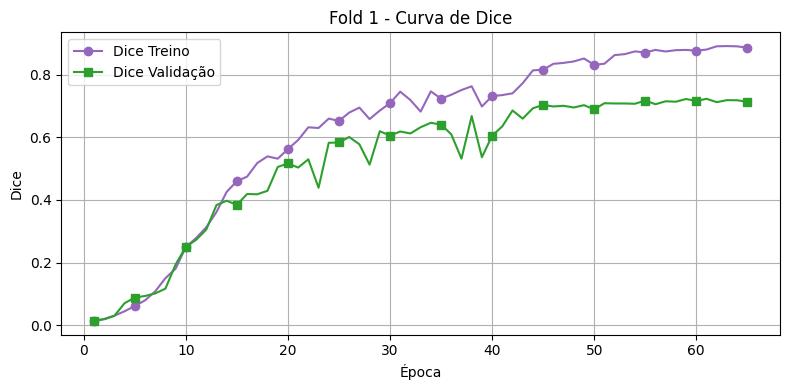

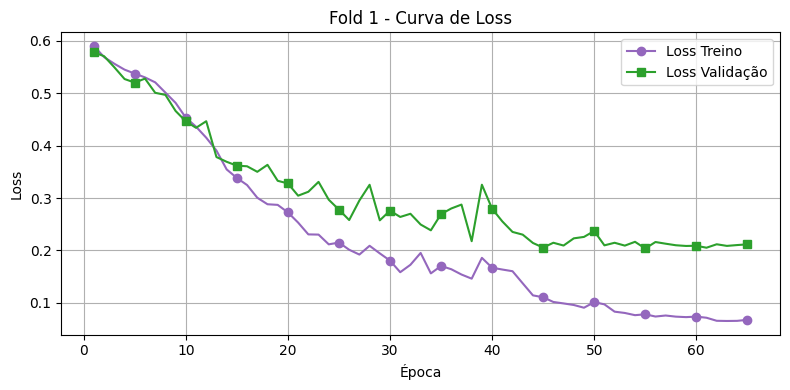

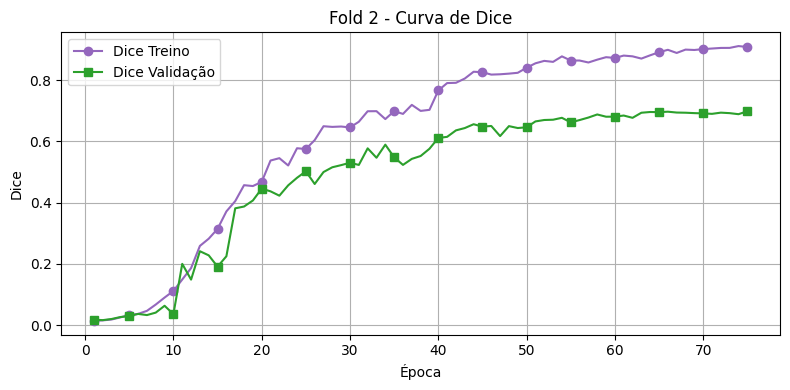

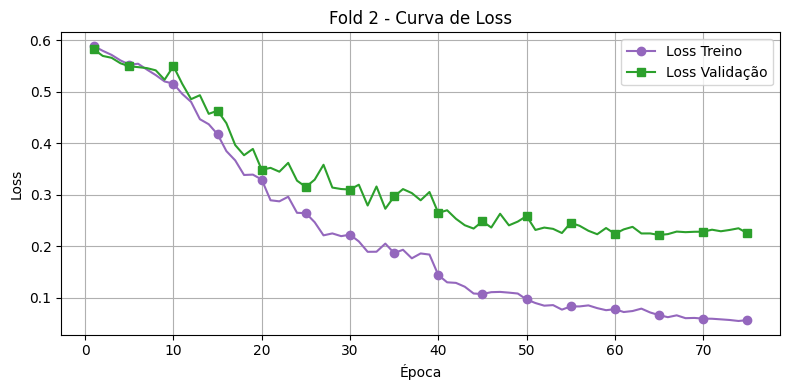

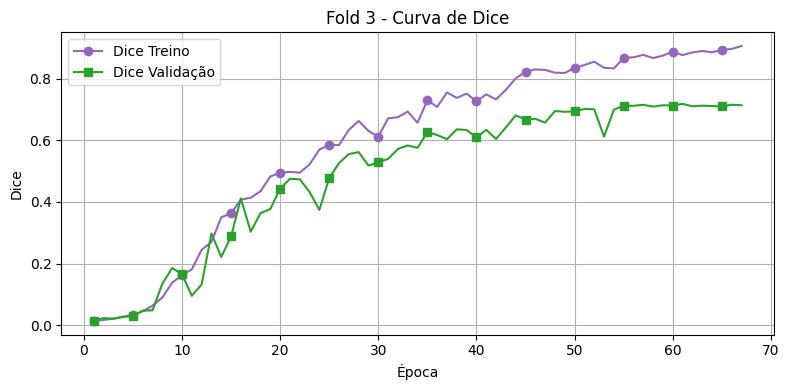

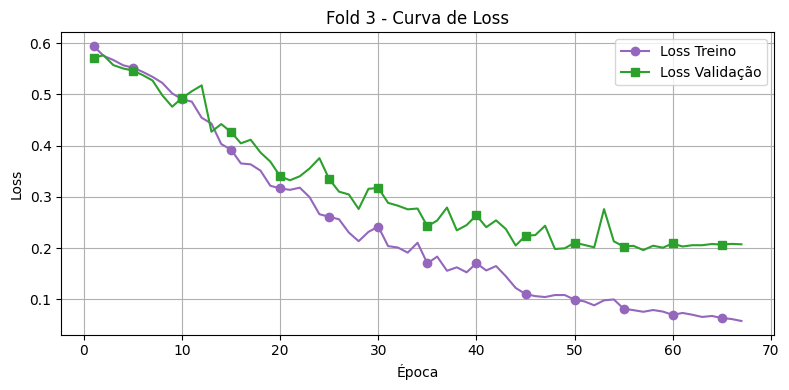

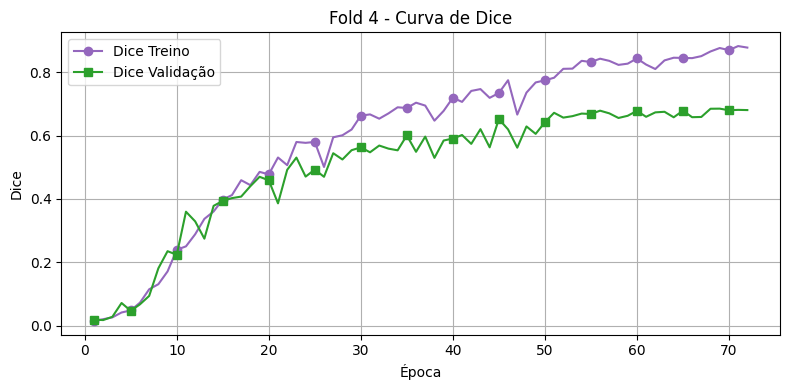

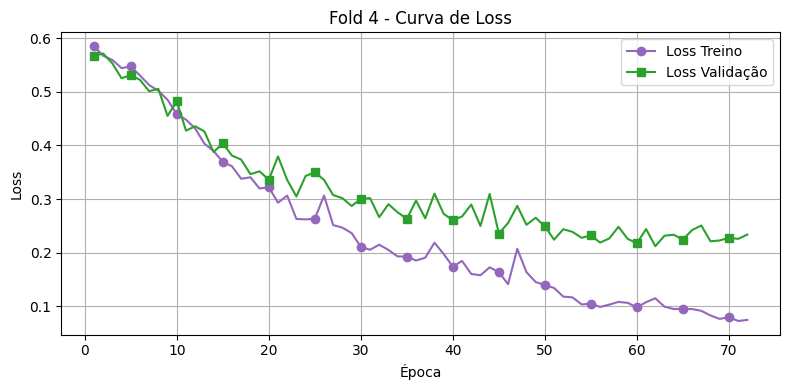

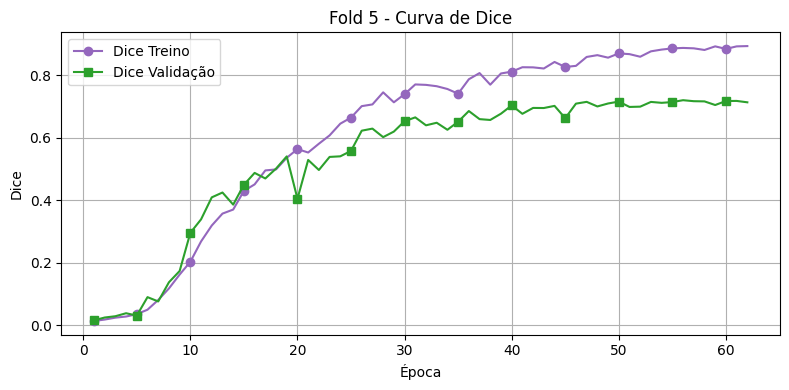

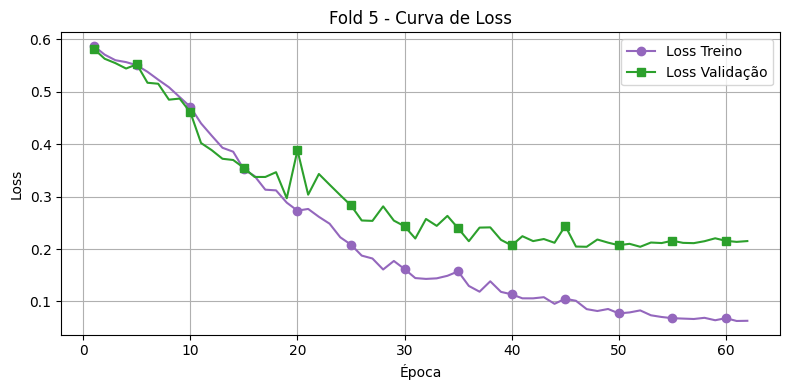

In [ ]:
for fold, hist in enumerate(histories):
    epochs = np.arange(1, len(hist['loss']) + 1)
    mark_epochs = np.array([1] + list(range(5, len(hist['loss']) + 1, 5)))

    # DICE
    plt.figure(figsize=(8, 4))
    plt.plot(epochs, hist['dice_coef'], label='Dice Treino', color='tab:purple', marker='o', markevery=mark_epochs - 1)
    plt.plot(epochs, hist['val_dice_coef'], label='Dice Validação', color='tab:green', marker='s', markevery=mark_epochs - 1)
    plt.title(f'Fold {fold+1} - Curva de Dice')
    plt.xlabel('Época')
    plt.ylabel('Dice')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

    # LOSS
    plt.figure(figsize=(8, 4))
    plt.plot(epochs, hist['loss'], label='Loss Treino', color='tab:purple', marker='o', markevery=mark_epochs - 1)
    plt.plot(epochs, hist['val_loss'], label='Loss Validação', color='tab:green', marker='s', markevery=mark_epochs - 1)
    plt.title(f'Fold {fold+1} - Curva de Loss')
    plt.xlabel('Época')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

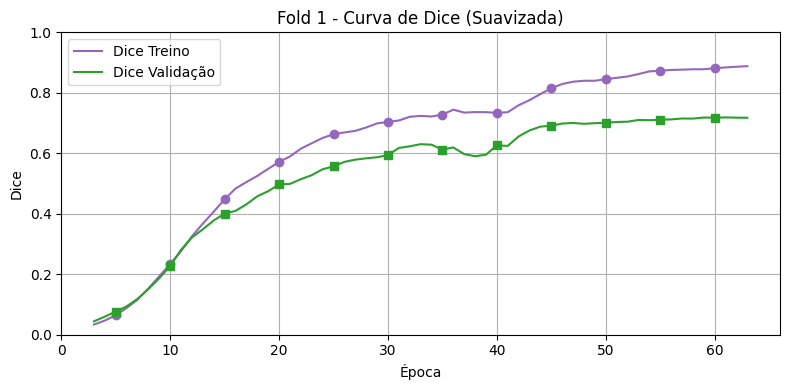

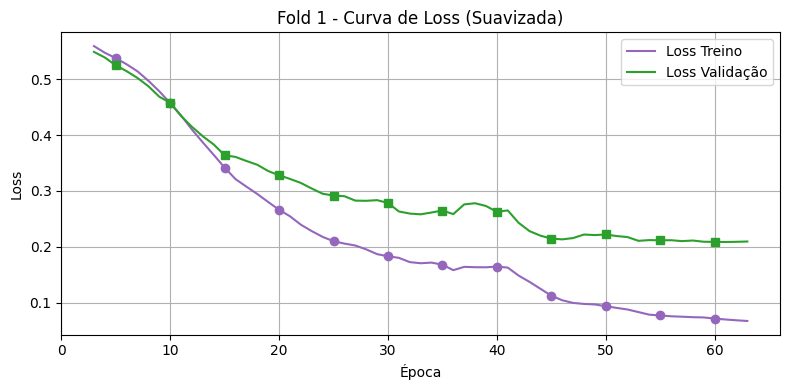

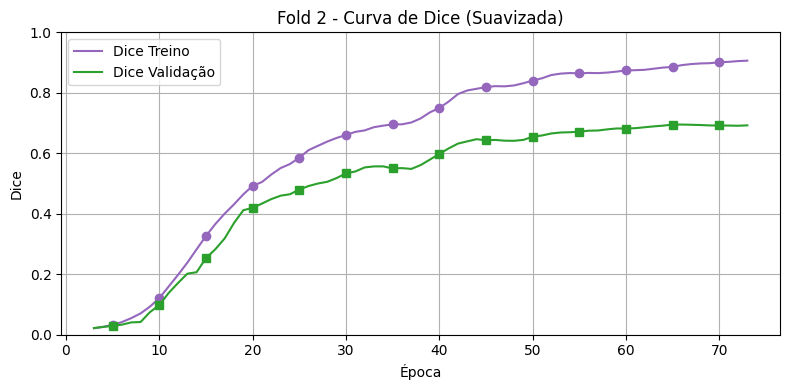

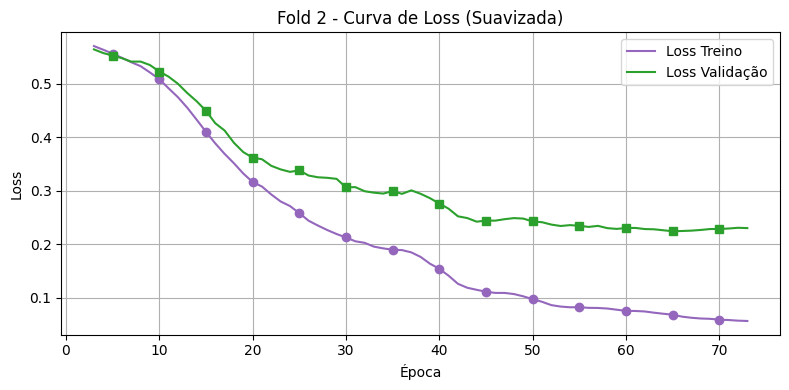

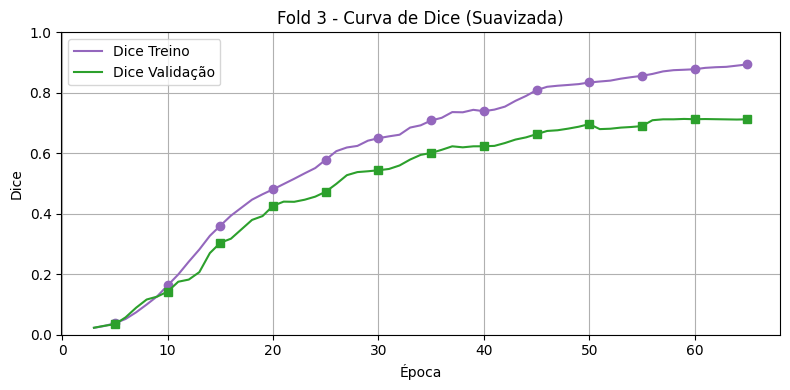

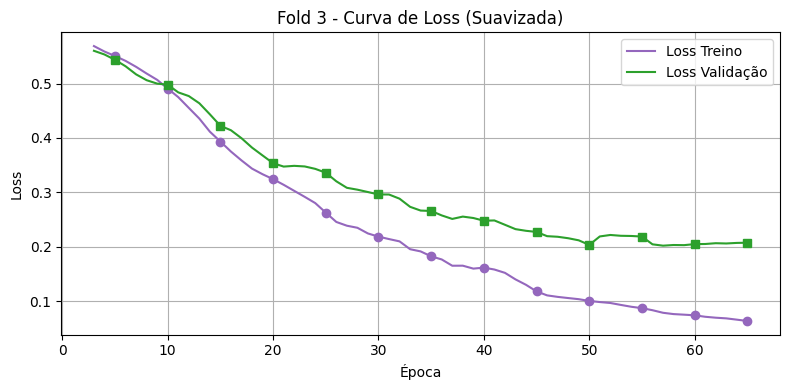

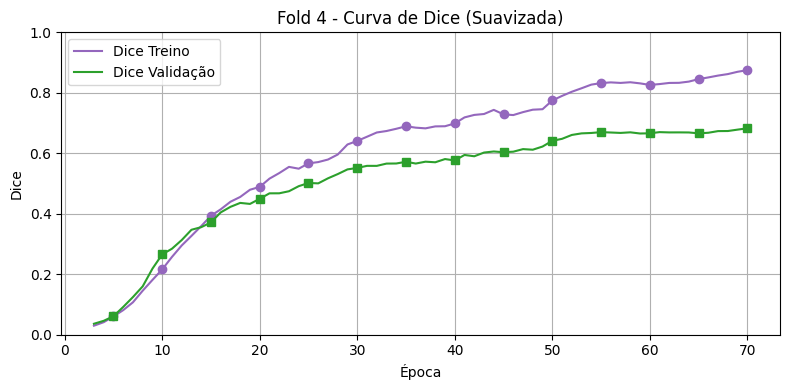

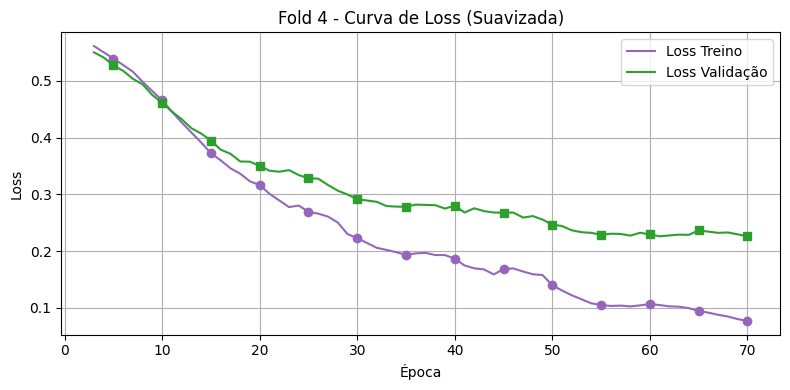

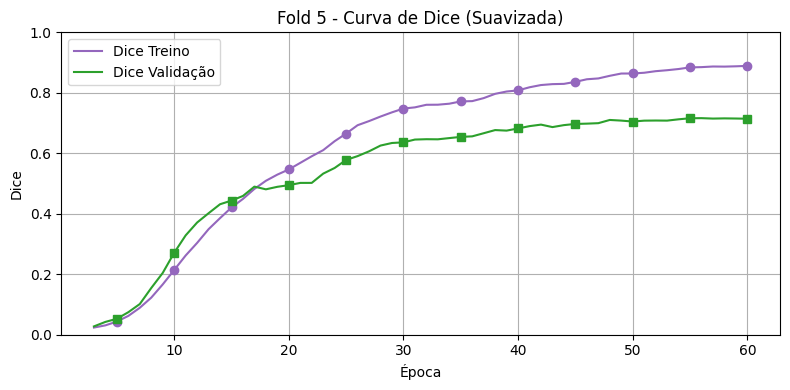

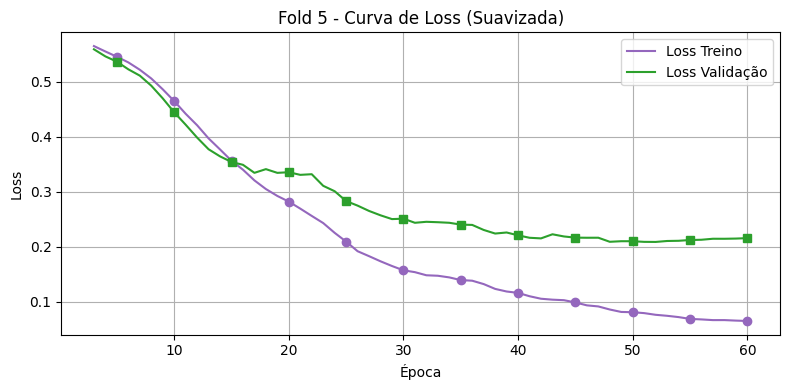

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def moving_average(data, window=5):
    return np.convolve(data, np.ones(window)/window, mode='valid')

for fold, hist in enumerate(histories):
    epochs = np.arange(1, len(hist['loss']) + 1)

    # Média móvel
    window = 5
    sm_dice_train = moving_average(hist['dice_coef'], window=window)
    sm_dice_val = moving_average(hist['val_dice_coef'], window=window)
    sm_loss_train = moving_average(hist['loss'], window=window)
    sm_loss_val = moving_average(hist['val_loss'], window=window)

    # Compensa o deslocamento da média
    sm_epochs = np.arange(window//2 + 1, len(hist['loss']) - (window//2) + 1)

    # Define épocas com marcador: 1, 5, 10...
    marker_epochs = [e for e in sm_epochs if e == 1 or e % 5 == 0]
    marker_indices = [np.where(sm_epochs == me)[0][0] for me in marker_epochs]

    # 🎯 DICE
    plt.figure(figsize=(8, 4))
    plt.plot(sm_epochs, sm_dice_train, color='tab:purple', label='Dice Treino')
    plt.plot(sm_epochs[marker_indices], sm_dice_train[marker_indices], 'o', color='tab:purple', label=None)

    plt.plot(sm_epochs, sm_dice_val, color='tab:green', label='Dice Validação')
    plt.plot(sm_epochs[marker_indices], sm_dice_val[marker_indices], 's', color='tab:green', label=None)

    plt.title(f'Fold {fold+1} - Curva de Dice (Suavizada)')
    plt.xlabel('Época')
    plt.ylabel('Dice')
    plt.legend()
    plt.ylim(0, 1)
    plt.grid()
    plt.tight_layout()
    plt.show()

    # 📉 LOSS
    plt.figure(figsize=(8, 4))
    plt.plot(sm_epochs, sm_loss_train, color='tab:purple', label='Loss Treino')
    plt.plot(sm_epochs[marker_indices], sm_loss_train[marker_indices], 'o', color='tab:purple', label=None)

    plt.plot(sm_epochs, sm_loss_val, color='tab:green', label='Loss Validação')
    plt.plot(sm_epochs[marker_indices], sm_loss_val[marker_indices], 's', color='tab:green', label=None)

    plt.title(f'Fold {fold+1} - Curva de Loss (Suavizada)')
    plt.xlabel('Época')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()


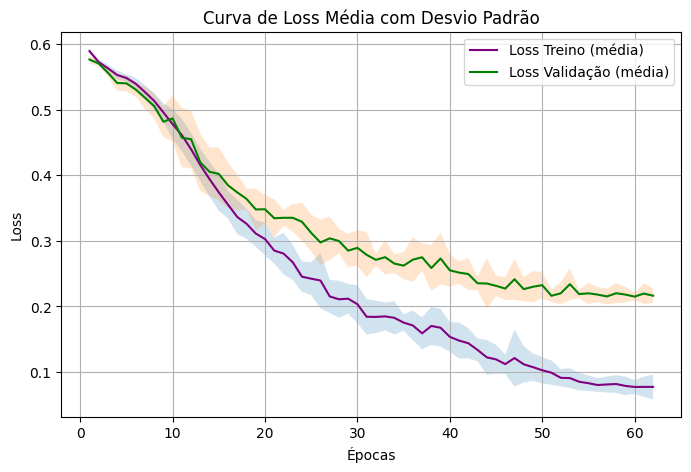

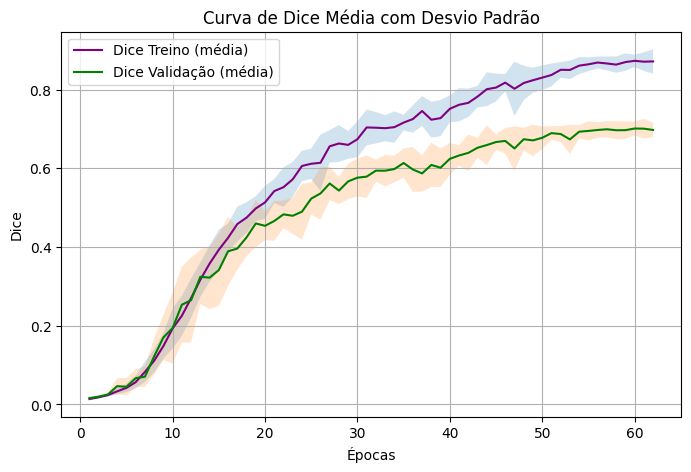

In [ ]:
# Curva de Loss e Dice Média com Desvio Padrão
max_epochs = min(len(h['loss']) for h in histories)
loss_train = np.array([h['loss'][:max_epochs] for h in histories])
loss_val = np.array([h['val_loss'][:max_epochs] for h in histories])
dice_train = np.array([h['dice_coef'][:max_epochs] for h in histories])
dice_val = np.array([h['val_dice_coef'][:max_epochs] for h in histories])
epochs = np.arange(1, max_epochs + 1)

plt.figure(figsize=(8,5))
plt.plot(epochs, loss_train.mean(axis=0), label='Loss Treino (média)', color='purple')
plt.fill_between(epochs, loss_train.mean(axis=0) - loss_train.std(axis=0),
                          loss_train.mean(axis=0) + loss_train.std(axis=0), alpha=0.2)
plt.plot(epochs, loss_val.mean(axis=0), label='Loss Validação (média)', color='green')
plt.fill_between(epochs, loss_val.mean(axis=0) - loss_val.std(axis=0),
                          loss_val.mean(axis=0) + loss_val.std(axis=0), alpha=0.2)
plt.title("Curva de Loss Média com Desvio Padrão")
plt.xlabel("Épocas")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8,5))
plt.plot(epochs, dice_train.mean(axis=0), label='Dice Treino (média)', color='purple')
plt.fill_between(epochs, dice_train.mean(axis=0) - dice_train.std(axis=0),
                          dice_train.mean(axis=0) + dice_train.std(axis=0), alpha=0.2)
plt.plot(epochs, dice_val.mean(axis=0), label='Dice Validação (média)', color='green')
plt.fill_between(epochs, dice_val.mean(axis=0) - dice_val.std(axis=0),
                          dice_val.mean(axis=0) + dice_val.std(axis=0), alpha=0.2)
plt.title("Curva de Dice Média com Desvio Padrão")
plt.xlabel("Épocas")
plt.ylabel("Dice")
plt.legend()
plt.grid()
plt.show()

# **Teste Final**

In [ ]:
# 🔍 Avaliação no conjunto de teste final
print("\n✅ Avaliação no Teste Final")
final_model = unet_model()
final_model.compile(optimizer='adam', loss=combined_loss, metrics=[dice_coef])
history_final = final_model.fit(X_trainval, Y_trainval, epochs=100, batch_size=8)

y_test_pred = final_model.predict(X_test) > 0.6
Y_probs_test = final_model.predict(X_test)

np.save("/content/drive/MyDrive/TCC/ResultadosUnet/X_test.npy", X_test)
np.save("/content/drive/MyDrive/TCC/ResultadosUnet/Y_test.npy", Y_test)
np.save("/content/drive/MyDrive/TCC/ResultadosUnet/Y_pred_test.npy", y_test_pred.astype(np.uint8))
np.save("/content/drive/MyDrive/TCC/ResultadosUnet/Y_probs_test.npy", Y_probs_test)

dice_test = dice_score(Y_test, y_test_pred)
iou_test = jaccard_score(Y_test.flatten(), y_test_pred.flatten(), zero_division=0)
recall_test = recall_score(Y_test.flatten(), y_test_pred.flatten(), zero_division=0)
precision_test = precision_score(Y_test.flatten(), y_test_pred.flatten(), zero_division=0)
f1_test = f1_score(Y_test.flatten(), y_test_pred.flatten(), zero_division=0)

print(f"\n🔍 Teste Final - Dice: {dice_test:.4f}, IoU: {iou_test:.4f}, Recall: {recall_test:.4f}, Precision: {precision_test:.4f}, F1: {f1_test:.4f}")


✅ Avaliação no Teste Final
Epoch 1/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - dice_coef: 0.0112 - loss: 0.6102
Epoch 2/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0186 - loss: 0.5742
Epoch 3/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0200 - loss: 0.5637
Epoch 4/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0229 - loss: 0.5546
Epoch 5/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0266 - loss: 0.5567
Epoch 6/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0305 - loss: 0.5506
Epoch 7/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0387 - loss: 0.5459
Epoch 8/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0443 - loss: 0.5407
Epoch 9/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0585 - loss: 0.5305
Epoch 10/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.0883 - loss: 0.5174
Epoch 11/100
367/367 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - dice_coef: 0.1027 - los

In [ ]:
# Lê o CSV salvo com as métricas dos folds
csv_path = "/content/drive/MyDrive/TCC/ResultadosUnet/fold_outputs/metricas_por_fold.csv"
df_folds = pd.read_csv(csv_path)

# Usa as métricas do teste final já calculadas
df_test = pd.DataFrame([{
    'fold': 'Teste Final',
    'dice': dice_test,
    'iou': iou_test,
    'recall': recall_test,
    'precision': precision_test,
    'f1': f1_test
}])

# Calcula média dos folds
df_folds_only = df_folds[~df_folds['fold'].astype(str).str.lower().str.contains("teste")]
media_row = df_folds_only.mean(numeric_only=True)
media_row['fold'] = 'Média (Folds)'

df_final = pd.concat([df_folds_only, pd.DataFrame([media_row]), df_test], ignore_index=True)

print("🔍 Tabela Final com Folds, Média e Teste Final:")
display(df_final.round(4))

🔍 Tabela Final com Folds, Média e Teste Final:


<ipython-input-23-9cf60d96dd8a>:18: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Média (Folds)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  media_row['fold'] = 'Média (Folds)'


,fold,dice,iou,recall,precision,f1
0,1,0.8052,0.6740,0.7400,0.8830,0.8052
1,2,0.7888,0.6513,0.7278,0.8610,0.7888
2,3,0.7963,0.6615,0.7452,0.8548,0.7963
3,4,0.7743,0.6318,0.7798,0.7690,0.7743
4,5,0.7931,0.6571,0.7928,0.7934,0.7931
5,Média (Folds),0.7915,0.6551,0.7571,0.8322,0.7915
6,Teste Final,0.8267,0.7045,0.8047,0.8499,0.8267


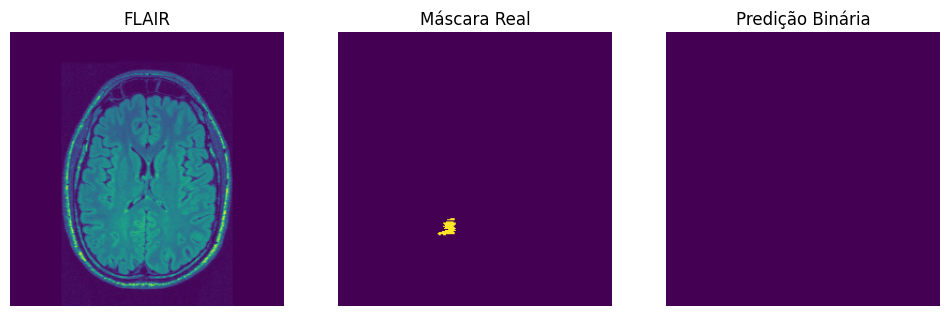

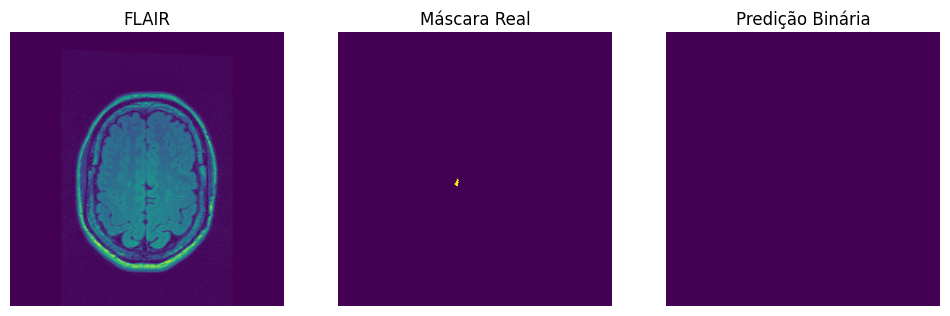

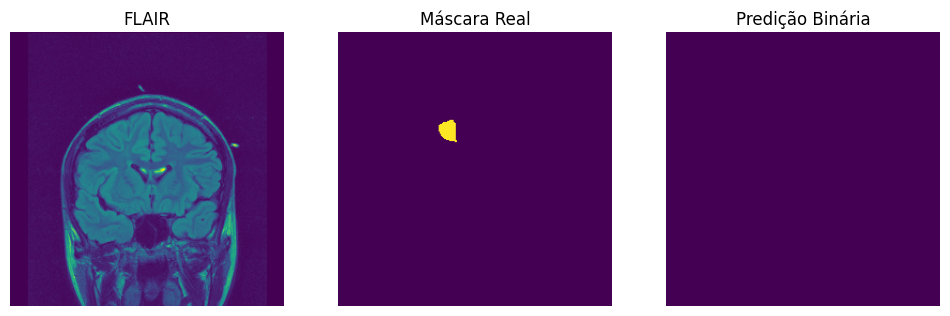

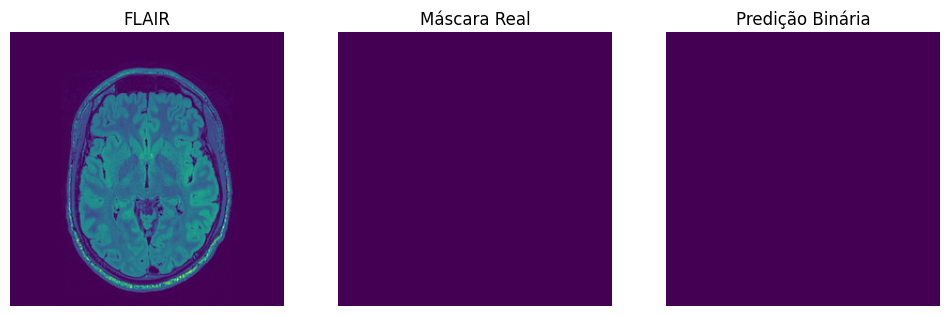

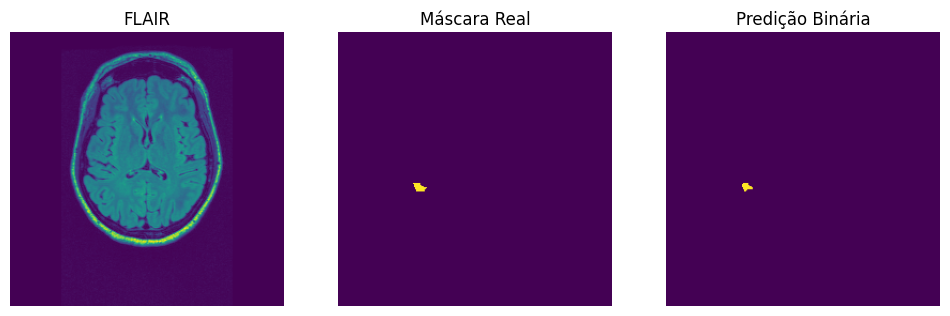

...

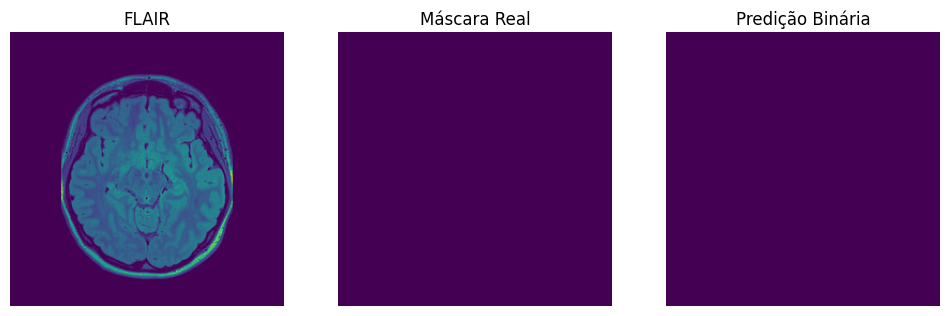

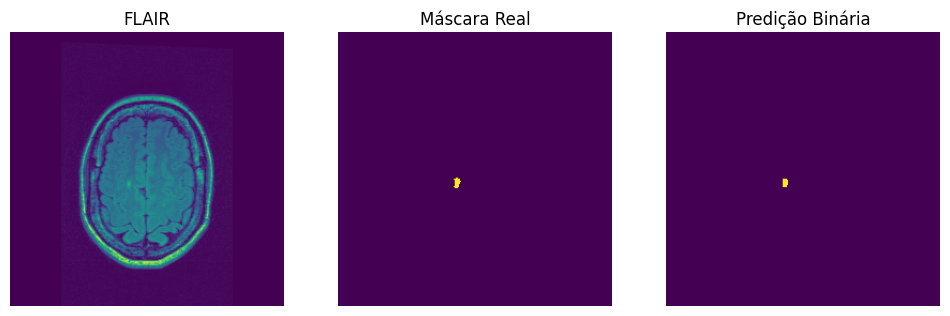

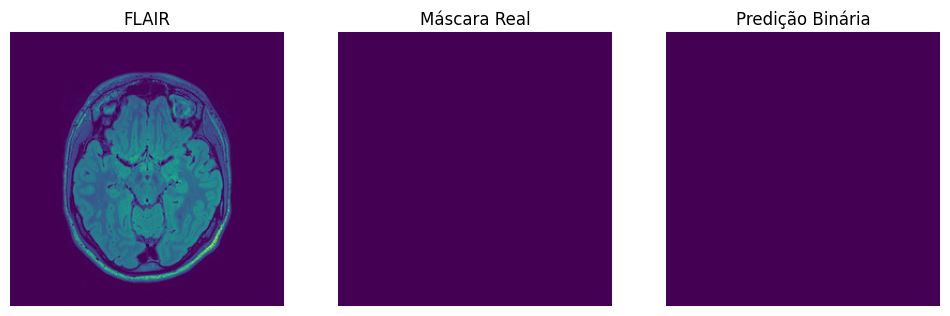

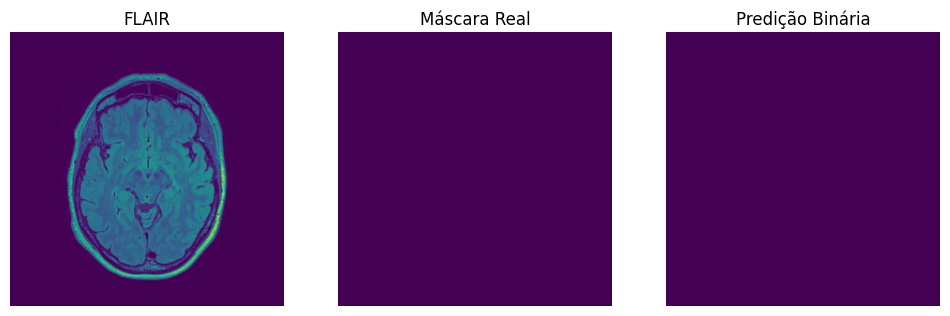

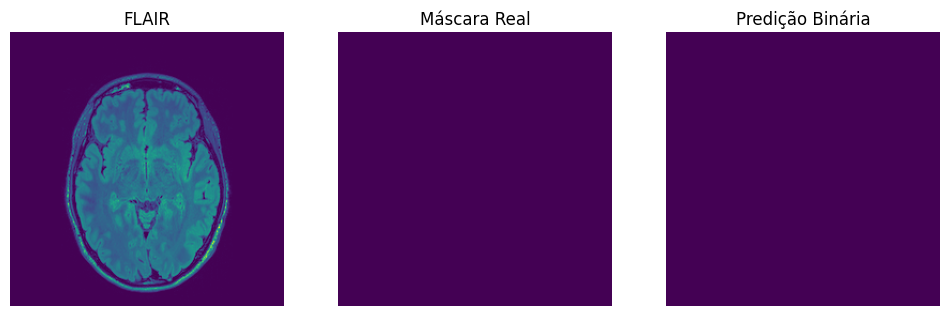

In [ ]:
# Visualização das predições do modelo em algumas slices do teste
Y_pred_bin_test = (Y_probs_test > 0.6).astype(np.uint8)

for i in range(20):
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.title("FLAIR")
    plt.imshow(X_test[i].squeeze(), cmap='viridis')
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.title("Máscara Real")
    plt.imshow(Y_test[i].squeeze(), cmap='viridis')
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.title("Predição Binária")
    plt.imshow(Y_pred_bin_test[i].squeeze(), cmap='viridis')
    plt.axis('off')

    plt.show()

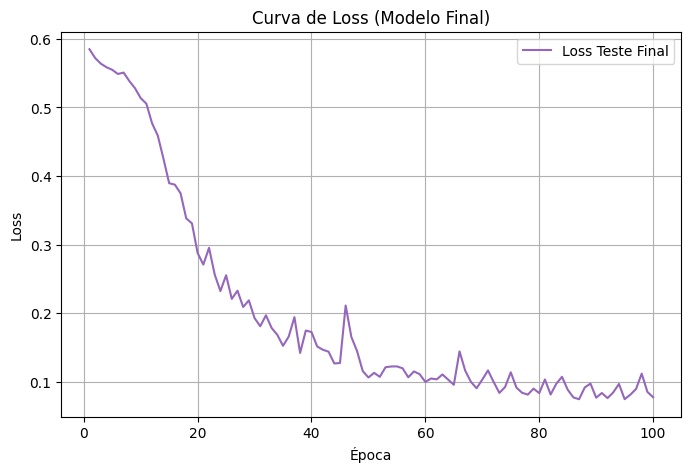

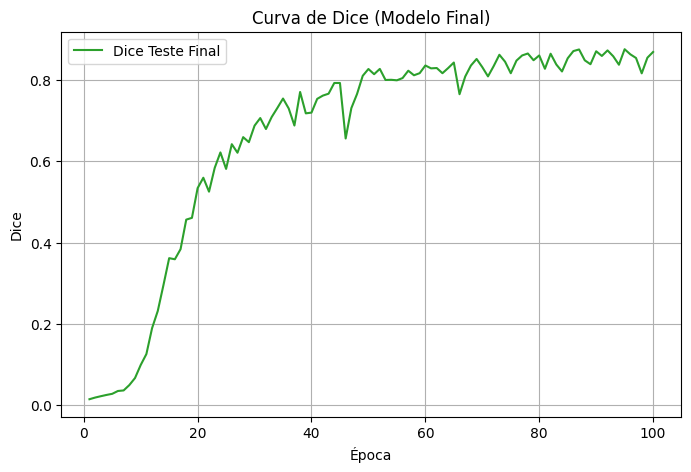

In [ ]:
# Gráficos de loss e dice
epochs = range(1, len(history_final.history['loss']) + 1)

# Loss
plt.figure(figsize=(8,5))
plt.plot(epochs, history_final.history['loss'], label='Loss Teste Final', color='tab:purple')
plt.title('Curva de Loss (Modelo Final)')
plt.xlabel('Época')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

# Dice
plt.figure(figsize=(8,5))
plt.plot(epochs, history_final.history['dice_coef'], label='Dice Teste Final', color='tab:green')
plt.title('Curva de Dice (Modelo Final)')
plt.xlabel('Época')
plt.ylabel('Dice')
plt.legend()
plt.grid()
plt.show()

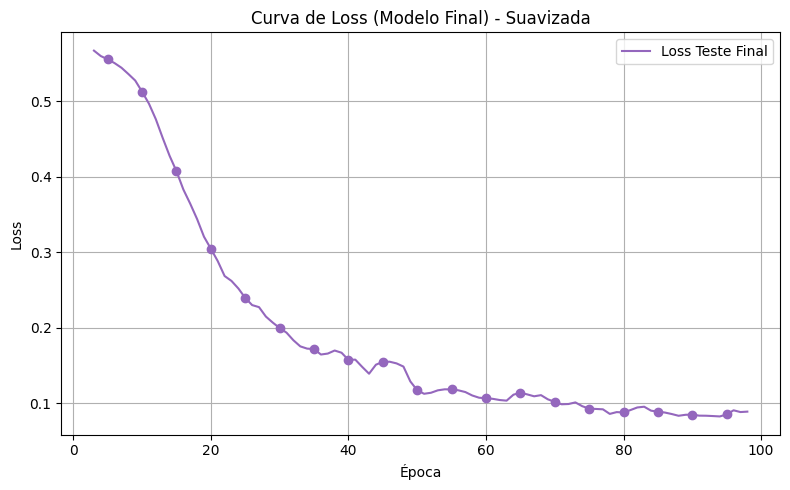

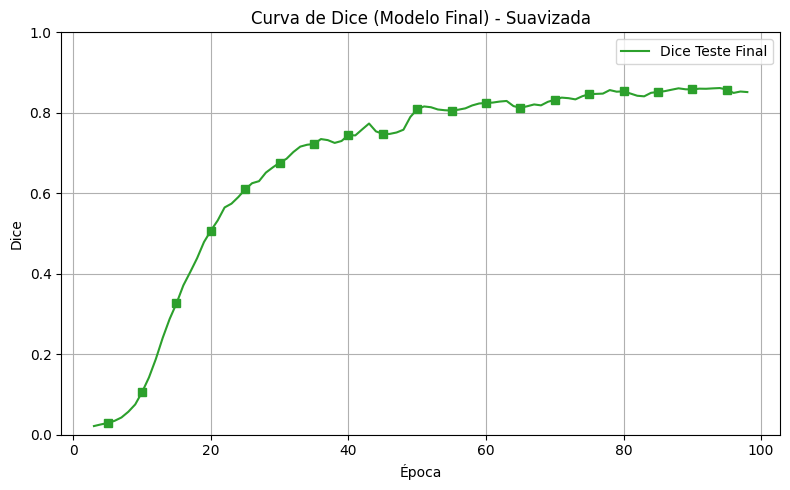

In [ ]:
def moving_average(data, window=5):
    return np.convolve(data, np.ones(window)/window, mode='valid')

# Dados originais
epochs = np.arange(1, len(history_final.history['loss']) + 1)
loss = history_final.history['loss']
dice = history_final.history['dice_coef']

# Suavização
window = 5
sm_loss = moving_average(loss, window)
sm_dice = moving_average(dice, window)
sm_epochs = np.arange(window//2 + 1, len(loss) - (window//2) + 1)

# Marcadores apenas em 1, 5, 10, ...
marker_epochs = [e for e in sm_epochs if e == 1 or e % 5 == 0]
marker_indices = [np.where(sm_epochs == me)[0][0] for me in marker_epochs]

# 📉 LOSS
plt.figure(figsize=(8,5))
plt.plot(sm_epochs, sm_loss, color='tab:purple', label='Loss Teste Final')
plt.plot(sm_epochs[marker_indices], sm_loss[marker_indices], 'o', color='tab:purple')
plt.title('Curva de Loss (Modelo Final) - Suavizada')
plt.xlabel('Época')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# 🎯 DICE
plt.figure(figsize=(8,5))
plt.plot(sm_epochs, sm_dice, color='tab:green', label='Dice Teste Final')
plt.plot(sm_epochs[marker_indices], sm_dice[marker_indices], 's', color='tab:green')
plt.title('Curva de Dice (Modelo Final) - Suavizada')
plt.xlabel('Época')
plt.ylabel('Dice')
plt.legend()
plt.grid()
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

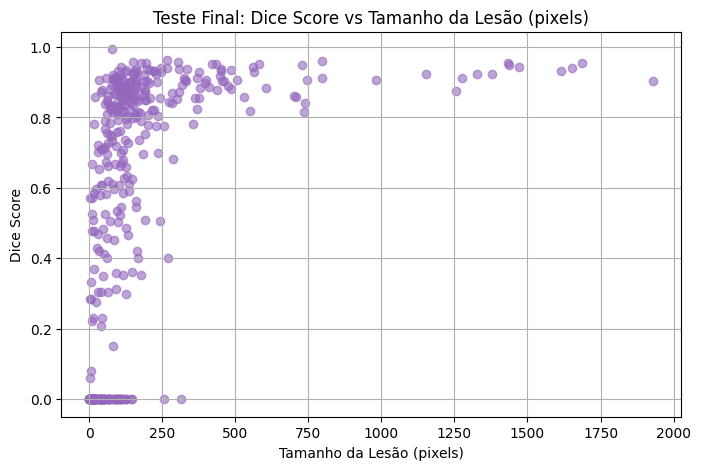

In [ ]:
# Plot Scatter
lesion_pixels_per_slice_test = [np.sum(y.squeeze()) for y in Y_test]
dice_per_slice_test = [dice_score(y.squeeze(), y_hat.squeeze())
                       for y, y_hat in zip(Y_test, Y_pred_bin_test)]

plt.figure(figsize=(8,5))
plt.scatter(
    np.array(lesion_pixels_per_slice_test)[np.array(lesion_pixels_per_slice_test) > 0],
    np.array(dice_per_slice_test)[np.array(lesion_pixels_per_slice_test) > 0],
    alpha=0.6, color='tab:purple'
)
plt.title("Teste Final: Dice Score vs Tamanho da Lesão (pixels)")
plt.xlabel("Tamanho da Lesão (pixels)")
plt.ylabel("Dice Score")
plt.grid(True)
plt.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


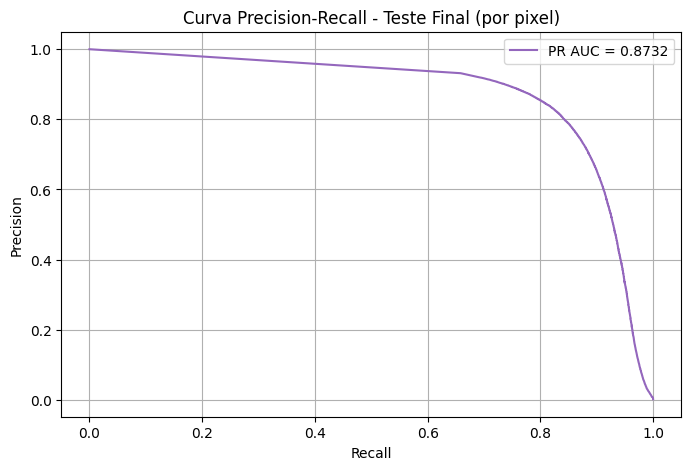

AUC PR (teste): 0.8732


In [ ]:
precision, recall, thresholds_pr = precision_recall_curve(all_y_true, all_y_probs)
pr_auc = auc(recall, precision)

plt.figure(figsize=(8, 5))
plt.plot(recall, precision, label=f'PR AUC = {pr_auc:.4f}', color='tab:purple')
plt.title('Curva Precision-Recall - Teste Final (por pixel)')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.grid()
plt.show()

print(f"AUC PR (teste): {pr_auc:.4f}")

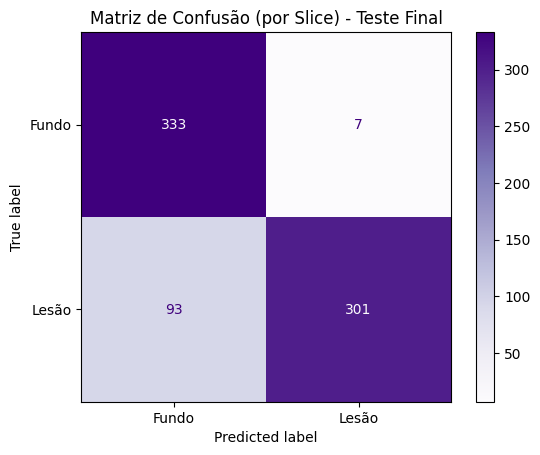

In [ ]:
# Matriz de Confusão (por Slice) - Teste Final
threshold = 0.6
y_true_slice = []
y_pred_slice = []

for i in range(len(X_test)):
    mask_true = Y_test[i].squeeze()
    pred_bin = (Y_probs_test[i].squeeze() > threshold).astype(np.uint8)

    has_lesion_gt = int(np.sum(mask_true) > 0)
    has_lesion_pred = int(np.sum(pred_bin) > 0)

    y_true_slice.append(has_lesion_gt)
    y_pred_slice.append(has_lesion_pred)

cm_slice = confusion_matrix(y_true_slice, y_pred_slice, labels=[0, 1])

disp = ConfusionMatrixDisplay(confusion_matrix=cm_slice, display_labels=["Fundo", "Lesão"])
disp.plot(cmap='Purples', values_format='d')
plt.title(f"Matriz de Confusão (por Slice) - Teste Final")
plt.grid(False)
plt.show()

cm_pixel = confusion_matrix(all_y_true, (all_y_probs > threshold).astype(np.uint8), labels=[0, 1])
cm_norm = cm_pixel.astype('float') / cm_pixel.sum(axis=1, keepdims=True)

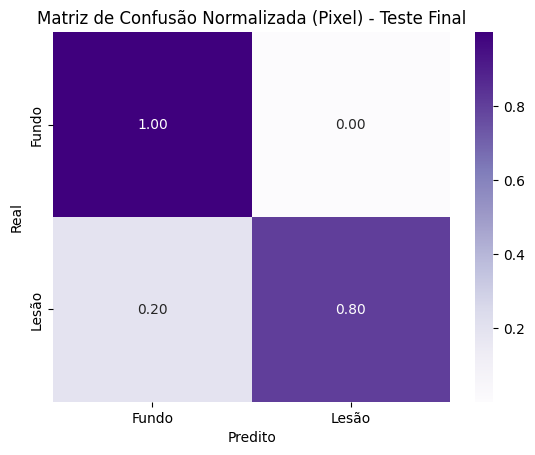

In [ ]:
# Matriz de Confusão Normalizada (Pixel) - Teste Final
sns.heatmap(cm_norm, annot=True, cmap='Purples', fmt='.2f',
            xticklabels=['Fundo', 'Lesão'], yticklabels=['Fundo', 'Lesão'])
plt.title(f"Matriz de Confusão Normalizada (Pixel) - Teste Final")
plt.xlabel("Predito")
plt.ylabel("Real")
plt.show()

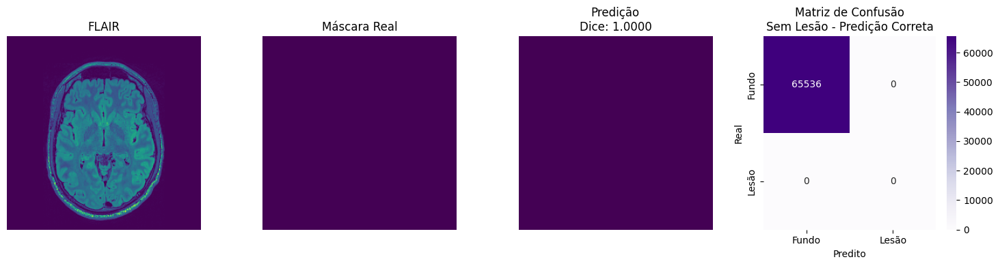

Dice: 1.0000, IoU: 0.0000, Recall: 0.0000, Precision: 0.0000, F1: 0.0000


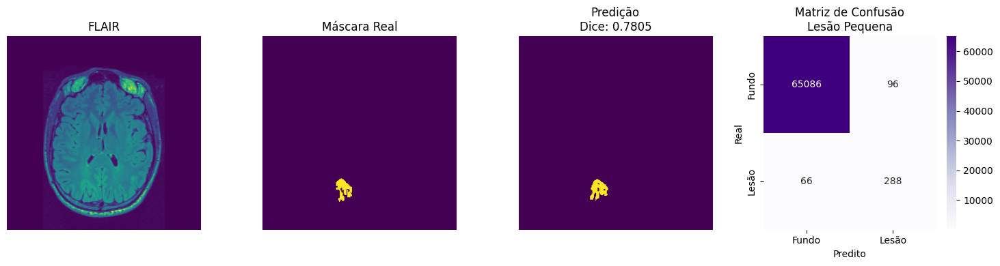

Dice: 0.7805, IoU: 0.6400, Recall: 0.8136, Precision: 0.7500, F1: 0.7805


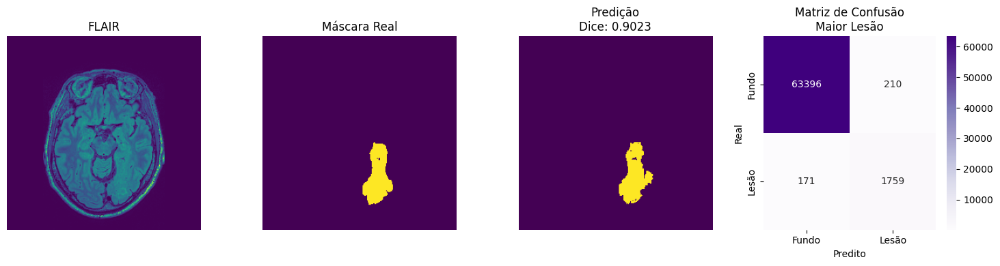

Dice: 0.9023, IoU: 0.8220, Recall: 0.9114, Precision: 0.8933, F1: 0.9023


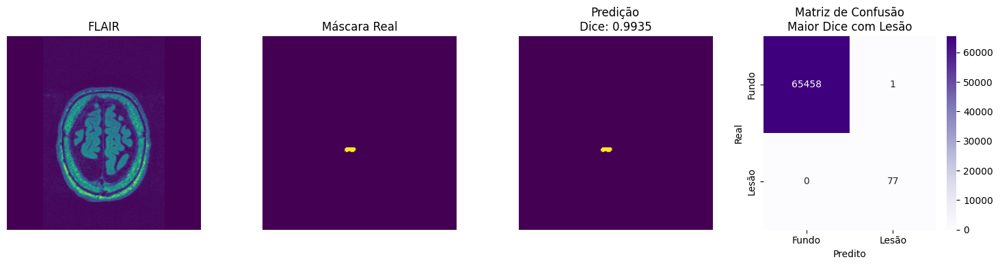

Dice: 0.9935, IoU: 0.9872, Recall: 1.0000, Precision: 0.9872, F1: 0.9935


In [ ]:
Y_test = np.load("/content/drive/MyDrive/TCC/ResultadosUnet/Y_test.npy")
Y_probs_test = np.load("/content/drive/MyDrive/TCC/ResultadosUnet/Y_probs_test.npy")
X_test = np.load("/content/drive/MyDrive/TCC/ResultadosUnet/X_test.npy")

def dice_score(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

# Plot qualitativo
def plot_qualitativo_teste(idx, title_extra=''):
    mask_true = Y_test[idx].squeeze()
    flair = X_test[idx].squeeze()
    pred_probs = Y_probs_test[idx].squeeze()
    pred_bin = (pred_probs > 0.6).astype(np.uint8)

    # Métricas
    dice = dice_score(mask_true, pred_bin)
    iou = jaccard_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
    recall = recall_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
    precision = precision_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
    f1 = f1_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
    cm = confusion_matrix(mask_true.flatten(), pred_bin.flatten(), labels=[0, 1])

    plt.figure(figsize=(15, 4))
    plt.subplot(1, 4, 1)
    plt.title("FLAIR")
    plt.imshow(flair, cmap='viridis')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title("Máscara Real")
    plt.imshow(mask_true, cmap='viridis')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title(f"Predição\nDice: {dice:.4f}")
    plt.imshow(pred_bin, cmap='viridis')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', xticklabels=['Fundo', 'Lesão'], yticklabels=['Fundo', 'Lesão'])
    plt.title(f"Matriz de Confusão\n{title_extra}")
    plt.xlabel("Predito")
    plt.ylabel("Real")

    plt.tight_layout()
    plt.show()

    print(f"Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

# Calcula métricas por slice
lesion_pixels_test = np.array([np.sum(mask.squeeze()) for mask in Y_test])
dice_per_slice_test = np.array([
    dice_score(y.squeeze(), (yp.squeeze() > 0.6).astype(np.uint8))
    for y, yp in zip(Y_test, Y_probs_test)
])

# Slice sem lesão e sem predição
no_lesion_cases = np.where(lesion_pixels_test == 0)[0]
valid_no_lesion = [i for i in no_lesion_cases if np.sum((Y_probs_test[i].squeeze() > 0.6).astype(np.uint8)) == 0]
if valid_no_lesion:
    plot_qualitativo_teste(valid_no_lesion[0], title_extra='Sem Lesão - Predição Correta')

# Lesão pequena (100–500 pixels)
lesion_small_cases = np.where((lesion_pixels_test > 300) & (lesion_pixels_test < 400))[0]
if len(lesion_small_cases) > 0:
    plot_qualitativo_teste(lesion_small_cases[0], title_extra='Lesão Pequena')

# Maior lesão
idx_max_lesion = np.argmax(lesion_pixels_test)
plot_qualitativo_teste(idx_max_lesion, title_extra='Maior Lesão')

# Maior Dice com lesão
cases_with_lesion = np.where(lesion_pixels_test > 0)[0]
idx_best_dice = cases_with_lesion[np.argmax(dice_per_slice_test[cases_with_lesion])]
plot_qualitativo_teste(idx_best_dice, title_extra='Maior Dice com Lesão')

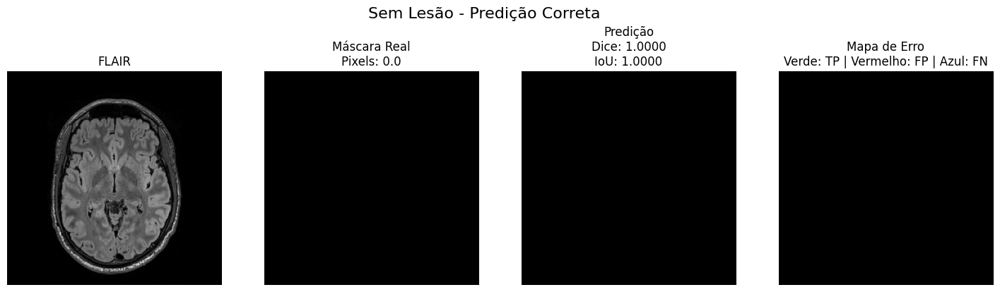

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


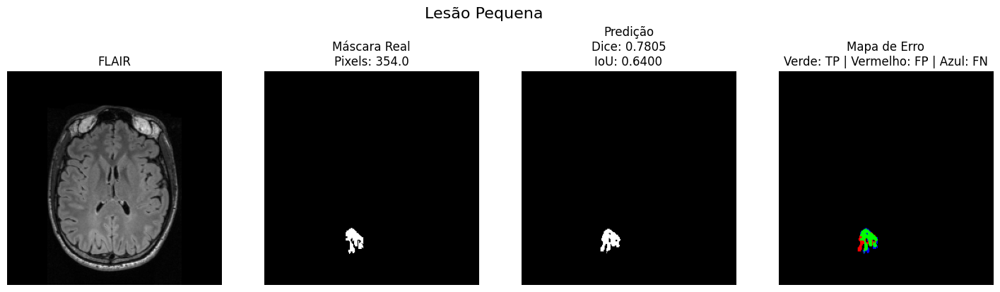

Dice: 0.7805, IoU: 0.6400, Recall: 0.8136, Precision: 0.7500, F1: 0.7805


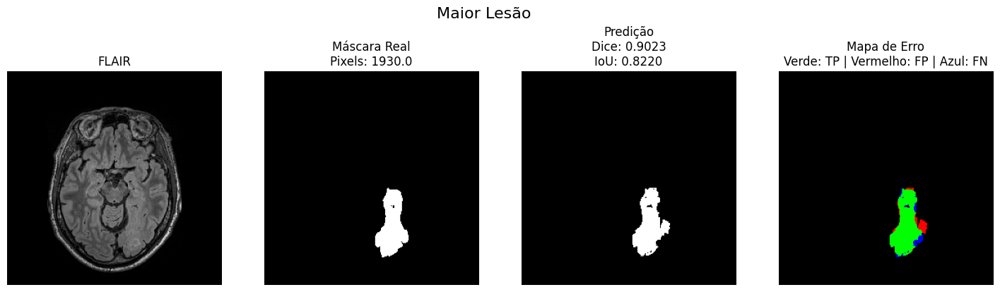

Dice: 0.9023, IoU: 0.8220, Recall: 0.9114, Precision: 0.8933, F1: 0.9023


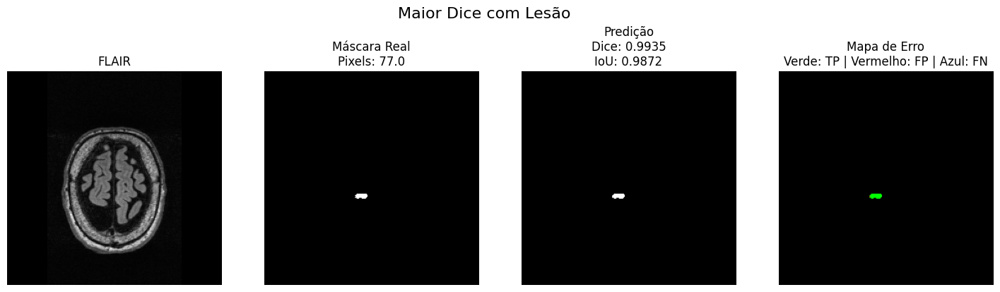

Dice: 0.9935, IoU: 0.9872, Recall: 1.0000, Precision: 0.9872, F1: 0.9935


In [ ]:
# Plot qualitativo com mapa de erro
def plot_case_qualitativo_teste(idx, title_extra=''):
    mask_true = Y_test[idx].squeeze()
    flair = X_test[idx].squeeze()
    pred_probs = Y_probs_test[idx].squeeze()
    pred_bin = (pred_probs > 0.6).astype(np.uint8)

    # Métricas
    dice = dice_score(mask_true, pred_bin)

    if np.sum(mask_true) == 0 and np.sum(pred_bin) == 0:
        # Sem lesão e sem predição — caso perfeito "negativo"
        dice = 1.0
        iou = 1.0
        recall = 1.0
        precision = 1.0
        f1 = 1.0
    else:
        iou = jaccard_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
        recall = recall_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
        precision = precision_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)
        f1 = f1_score(mask_true.flatten(), pred_bin.flatten(), zero_division=0)


    # Mapa de erro
    intersection = np.logical_and(mask_true == 1, pred_bin == 1)
    false_positive = np.logical_and(mask_true == 0, pred_bin == 1)
    false_negative = np.logical_and(mask_true == 1, pred_bin == 0)
    error_map = np.zeros((*mask_true.shape, 3), dtype=np.uint8)
    error_map[intersection] = [0, 255, 0]    # TP - Verde
    error_map[false_positive] = [255, 0, 0]  # FP - Vermelho
    error_map[false_negative] = [0, 0, 255]  # FN - Azul

    plt.figure(figsize=(18, 5))
    plt.subplot(1, 4, 1)
    plt.title("FLAIR")
    plt.imshow(flair, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title(f"Máscara Real\nPixels: {np.sum(mask_true)}")
    plt.imshow(mask_true, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title(f"Predição\nDice: {dice:.4f}\nIoU: {iou:.4f}")
    plt.imshow(pred_bin, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Mapa de Erro\nVerde: TP | Vermelho: FP | Azul: FN")
    plt.imshow(error_map)
    plt.axis('off')

    plt.suptitle(f'{title_extra}', fontsize=16)
    plt.show()

    print(f"Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

# Calcula métricas por slice
lesion_pixels_test = np.array([np.sum(mask.squeeze()) for mask in Y_test])
dice_per_slice_test = np.array([
    dice_score(y.squeeze(), (yp.squeeze() > 0.6).astype(np.uint8))
    for y, yp in zip(Y_test, Y_probs_test)
])

# Slice sem lesão e sem predição
no_lesion_cases = np.where(lesion_pixels_test == 0)[0]
valid_no_lesion = [i for i in no_lesion_cases if np.sum((Y_probs_test[i].squeeze() > 0.6).astype(np.uint8)) == 0]
if valid_no_lesion:
    plot_case_qualitativo_teste(valid_no_lesion[0], title_extra='Sem Lesão - Predição Correta')

# Lesão pequena (100–500 pixels)
lesion_small_cases = np.where((lesion_pixels_test > 300) & (lesion_pixels_test < 400))[0]
if len(lesion_small_cases) > 0:
    plot_case_qualitativo_teste(lesion_small_cases[0], title_extra='Lesão Pequena')

# Maior lesão
idx_max_lesion = np.argmax(lesion_pixels_test)
plot_case_qualitativo_teste(idx_max_lesion, title_extra='Maior Lesão')

# Maior Dice com lesão
cases_with_lesion = np.where(lesion_pixels_test > 0)[0]
idx_best_dice = cases_with_lesion[np.argmax(dice_per_slice_test[cases_with_lesion])]
plot_case_qualitativo_teste(idx_best_dice, title_extra='Maior Dice com Lesão')